In [1]:
library(corrplot)
library(glue)
library(ISLR2)
library(psych)

options(repr.plot.width = 20, repr.plot.height = 20)
my_corrplot = function(x) {
    corrplot(x, method = "circle", type = "lower",
         tl.cex = 2,  # text label size
         cl.cex = 2,  # color legend text size
         number.cex = 2  # size of correlation coefficients
    )
}

corrplot 0.92 loaded



# Chapter 2 Conceptual
## 1. For each of parts (a) through (d), indicate whether we would generally expect the performance of a flexible statistical learning method to be better or worse than an inflexible method. Justify your answer.
### (a) The sample size n is extremely large, and the number of predictors p is small.
When the sample size is very large and the number of predictors is small, flexible methods are generally more suitable. The large dataset offers protection against overfitting, and a flexible model can more effectively find valuable relationships between the predictors and the dependent variable.
### (b) The number of predictors p is extremely large, and the number of observations n is small.
When there's high dimensionality and a small sample size, the risk of overfitting becomes significant. This scenario clearly calls for a more rigid model; otherwise, the algorithm may establish arbitrary relationships that are not predictive in another dataset.
### (c) The relationship between the predictors and response is highly non-linear.
Inflexible models struggle to capture the relationships between independent and dependent variables in a non-linear system. It's challenging to fit a linear system to data that isn't linearly dependent. A more flexible model will better approximate the relationship.
### (d) The variance of the error terms, i.e. σ2 = Var(ϵ), is extremely high.
Linear models excel in high-variance datasets. A more flexible model is likely to overfit to the noise in the data, whereas a linear model might not capture all the structure but will avoid overfitting.
## 2. Explain whether each scenario is a classification or regression problem, and indicate whether we are most interested in inference or prediction. Finally, provide n and p.
### (a) We collect a set of data on the top 500 firms in the US. For each firm we record profit, number of employees, industry and the CEO salary. We are interested in understanding which factors affect CEO salary.
This is a regression problem since the dependent variable, the CEO's salary, is continuous, not discrete. The question states, "We are interested in understanding which factors affect CEO salary," hence, it's an inference problem. The goal is not to predict the CEO's salary, but to understand which features influence it. The sample size is 500 (the number of firms), and there are three features: profit, number of employees, and industry.
### (b) We are considering launching a new product and wish to know whether it will be a success or a failure. We collect data on 20 similar products that were previously launched. For each product we have recorded whether it was a success or failure, price charged for the product, marketing budget, competition price, and ten other variables.
The success or failure is binary, so this is a classification problem. The desired outcome is forward-looking, aiming to predict what will happen, so it is predictive in nature. The sample size is 20 (the number of products), and there are 13 features: product price, marketing budget, competition price, and ten others. Whether the product was a success or failure is a dependent variable.
### (c) We are interested in predicting the % change in the USD/Euro exchange rate in relation to the weekly changes in the world stock markets. Hence we collect weekly data for all of 2012. For each week we record the % change in the USD/Euro, the % change in the US market, the % change in the British market, and the % change in the German market.
The % change in the exchange rate will yield a continuous output, so this is a regression problem. The question states we are interested in predicting the percent change, hence, it's a prediction problem. There are 52 samples, one for each week of the year, and three features: the percent change in the US, British, and German markets.
## 7. The table below provides a training data set containing six observations, three predictors, and one qualitative response variable.

In [2]:
Table2_4_7 = data.frame(
    "Obs" = c(1:6),
    "X_1" = c(0,2,0,0,-1,1),
    "X_2" = c(3,0,1,1,0,1), 
    "X_3" = c(0,0,3,2,1,1),
    "Y" = c('Red', 'Red', 'Red', 'Green', 'Green', 'Red')
)
View(Table2_4_7)

Obs,X_1,X_2,X_3,Y
<int>,<dbl>,<dbl>,<dbl>,<chr>
1,0,3,0,Red
2,2,0,0,Red
3,0,1,3,Red
4,0,1,2,Green
5,-1,0,1,Green
6,1,1,1,Red


## Suppose we wish to use this data set to make a prediction for Y when X1 = X2 = X3 = 0 using K-nearest neighbors.
### (a) Compute the Euclidean distance between each observation and the test point, X1 = X2 = X3 = 0.
The Euclidean Distance formula is sqrt((p1-q1)^2 + (p2-q2)^2+...+(pn-qn)^2). We need to find the distance between each observation and the origin (0,0,0).

Observation 1: sqrt((0-0)^2 + (3-0)^2 + (0-0)^2) = 3
Observation 2: sqrt((2-0)^2 + (0-0)^2 + (0-0)^2) = 2
Observation 3: sqrt((0-0)^2 + (1-0)^2 + (3-0)^2) = sqrt(10) ~3.16
Observation 4: sqrt((0-0)^2 + (1-0)^2 + (2-0)^2) = sqrt(5) ~2.24
Observation 5: sqrt((-1-0)^2 + (0-0)^2 + (1-0)^2) = sqrt(2) ~1.41
Observation 6: sqrt((1-0)^2 + (1-0)^2 + (1-0)^2) = sqrt(3) ~1.73
### (b) What is our prediction with K = 1? Why?
The closest neighbor to (0, 0, 0) in our dataset is Observation 5, as 1.41 is the nearest value and we are only selecting one neighbor. Thus, we would predict 'Green'.
### (c) What is our prediction with K = 3? Why?
With K=3, we select the three closest neighbors to (0,0,0). These are observations 5, 6, and 2. The Y values for 5, 6, and 2 are Green, Red, and Red, respectively. Since two out of the three neighbors are red, we would predict 'Red'.
### (d) If the Bayes decision boundary in this problem is highly nonlinear, then would we expect the best value for K to be large or small? Why?
A large K value would smooth or flatten the decision boundary towards linearity. Therefore, in this case, it would be better to have a small K value. However, if we select too small a K, it may result in overfitting.

# Chapter 2 Applied:
## Exercise 8: The College Dataset.

In [3]:
college = read.csv("/kaggle/input/cs5565-datasets/ALL CSV FILES - 2nd Edition/College.csv")

In [4]:
rownames(college) = college[,1]
View(college)

,X,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Abilene Christian University,Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
Albertson College,Albertson College,Yes,587,479,158,38,62,678,41,13500,3335,500,675,67,73,9.4,11,9727,55
Albertus Magnus College,Albertus Magnus College,Yes,353,340,103,17,45,416,230,13290,5720,500,1500,90,93,11.5,26,8861,63
Albion College,Albion College,Yes,1899,1720,489,37,68,1594,32,13868,4826,450,850,89,100,13.7,37,11487,73
Albright College,Albright College,Yes,1038,839,227,30,63,973,306,15595,4400,300,500,79,84,11.3,23,11644,80


In [5]:
college = college[,-1]
View(college)

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
Albertson College,Yes,587,479,158,38,62,678,41,13500,3335,500,675,67,73,9.4,11,9727,55
Albertus Magnus College,Yes,353,340,103,17,45,416,230,13290,5720,500,1500,90,93,11.5,26,8861,63
Albion College,Yes,1899,1720,489,37,68,1594,32,13868,4826,450,850,89,100,13.7,37,11487,73
Albright College,Yes,1038,839,227,30,63,973,306,15595,4400,300,500,79,84,11.3,23,11644,80


In [6]:
summary(college)

   Private               Apps           Accept          Enroll    
 Length:777         Min.   :   81   Min.   :   72   Min.   :  35  
 Class :character   1st Qu.:  776   1st Qu.:  604   1st Qu.: 242  
 Mode  :character   Median : 1558   Median : 1110   Median : 434  
                    Mean   : 3002   Mean   : 2019   Mean   : 780  
                    3rd Qu.: 3624   3rd Qu.: 2424   3rd Qu.: 902  
                    Max.   :48094   Max.   :26330   Max.   :6392  
   Top10perc       Top25perc      F.Undergrad     P.Undergrad     
 Min.   : 1.00   Min.   :  9.0   Min.   :  139   Min.   :    1.0  
 1st Qu.:15.00   1st Qu.: 41.0   1st Qu.:  992   1st Qu.:   95.0  
 Median :23.00   Median : 54.0   Median : 1707   Median :  353.0  
 Mean   :27.56   Mean   : 55.8   Mean   : 3700   Mean   :  855.3  
 3rd Qu.:35.00   3rd Qu.: 69.0   3rd Qu.: 4005   3rd Qu.:  967.0  
 Max.   :96.00   Max.   :100.0   Max.   :31643   Max.   :21836.0  
    Outstate       Room.Board       Books           Personal  

pairs(college[,1:10] threw an error due to private being a string.  That's why I quantized it below.

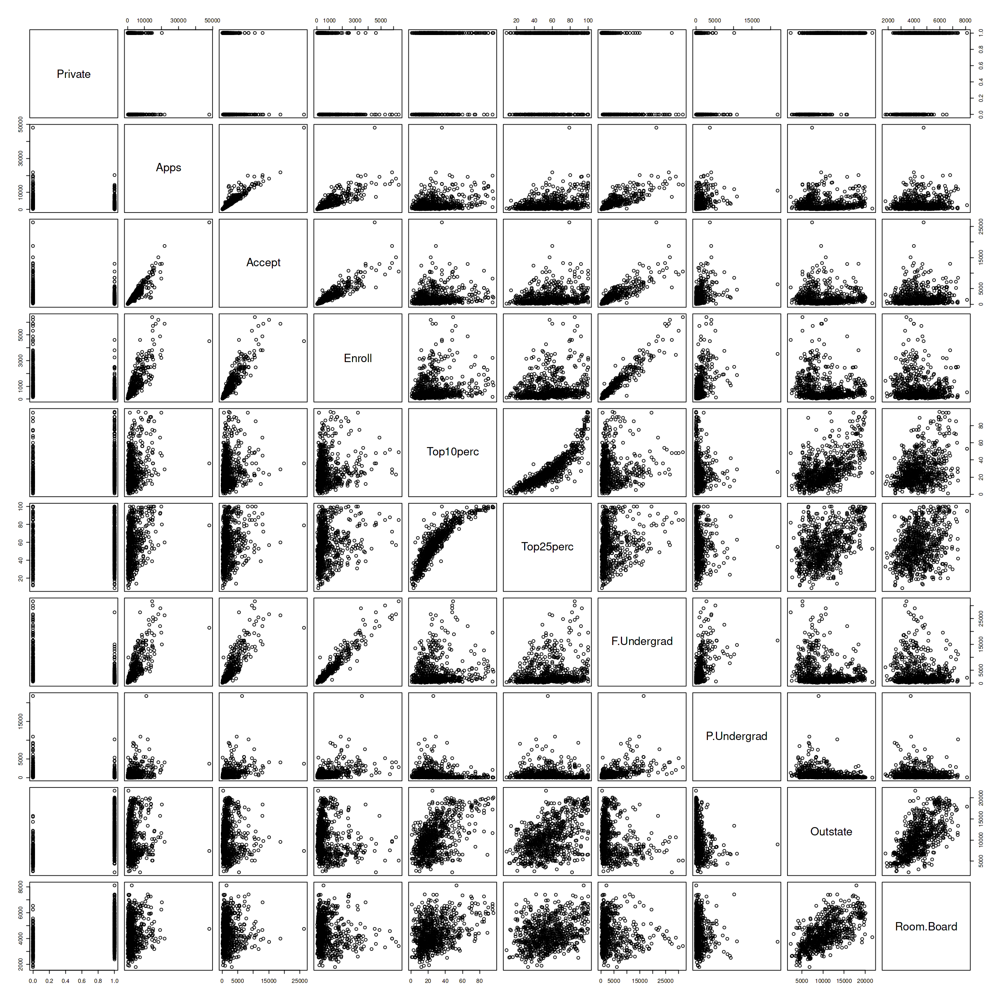

In [7]:
college$Private = ifelse(college$Private == 'Yes', 1, 0)
pairs(college[,1:10], cex.labels = 2.0)

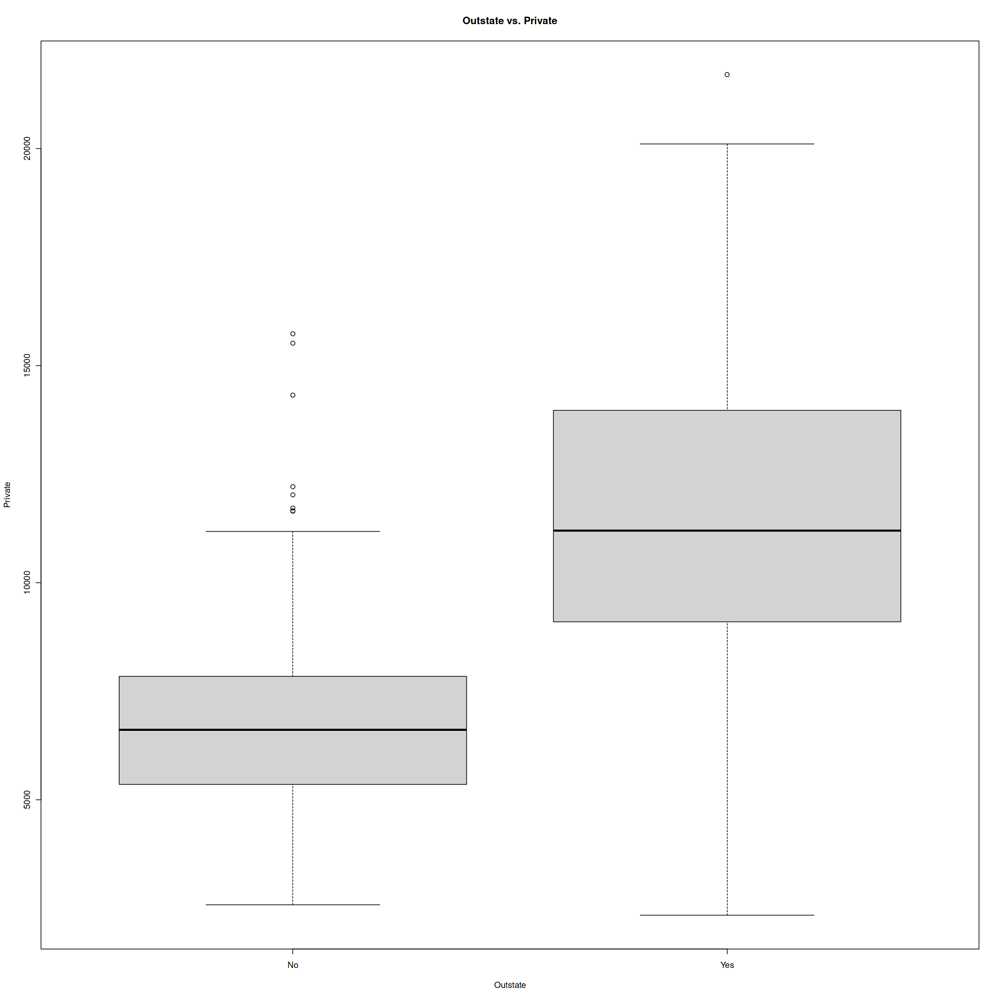

In [8]:
college$Private = ifelse(college$Private == 1, "Yes", "No")
boxplot(college$Outstate ~ college$Private, 
        main = 'Outstate vs. Private', 
        xlab = "Outstate", 
        ylab = 'Private', 
       )

In [9]:
Elite = rep('No', nrow(college))
Elite[college$Top10perc > 50] = 'Yes'
Elite = as.factor(Elite)
college <- data.frame(college, Elite)

In [10]:
summary(college)

   Private               Apps           Accept          Enroll    
 Length:777         Min.   :   81   Min.   :   72   Min.   :  35  
 Class :character   1st Qu.:  776   1st Qu.:  604   1st Qu.: 242  
 Mode  :character   Median : 1558   Median : 1110   Median : 434  
                    Mean   : 3002   Mean   : 2019   Mean   : 780  
                    3rd Qu.: 3624   3rd Qu.: 2424   3rd Qu.: 902  
                    Max.   :48094   Max.   :26330   Max.   :6392  
   Top10perc       Top25perc      F.Undergrad     P.Undergrad     
 Min.   : 1.00   Min.   :  9.0   Min.   :  139   Min.   :    1.0  
 1st Qu.:15.00   1st Qu.: 41.0   1st Qu.:  992   1st Qu.:   95.0  
 Median :23.00   Median : 54.0   Median : 1707   Median :  353.0  
 Mean   :27.56   Mean   : 55.8   Mean   : 3700   Mean   :  855.3  
 3rd Qu.:35.00   3rd Qu.: 69.0   3rd Qu.: 4005   3rd Qu.:  967.0  
 Max.   :96.00   Max.   :100.0   Max.   :31643   Max.   :21836.0  
    Outstate       Room.Board       Books           Personal  

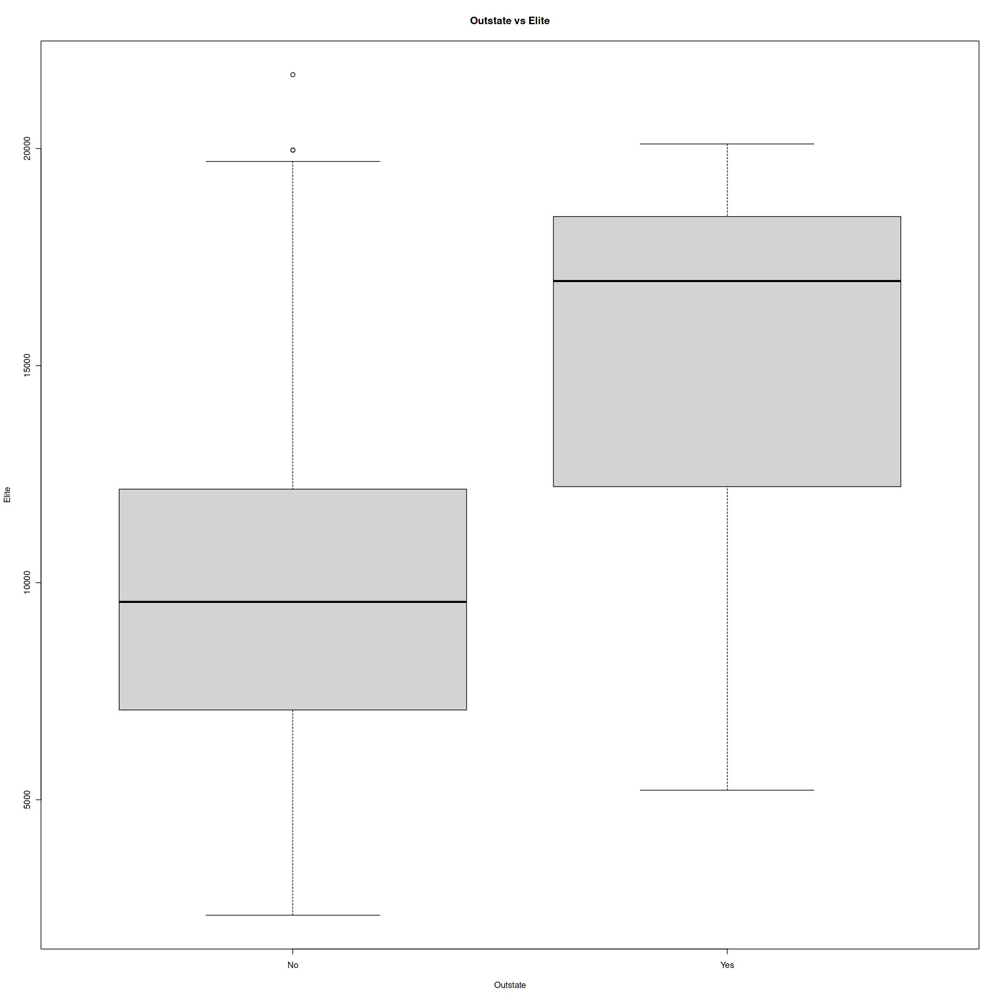

In [11]:
boxplot(college$Outstate ~ college$Elite, 
       main = "Outstate vs Elite", 
       xlab = "Outstate", 
       ylab = "Elite",
       )

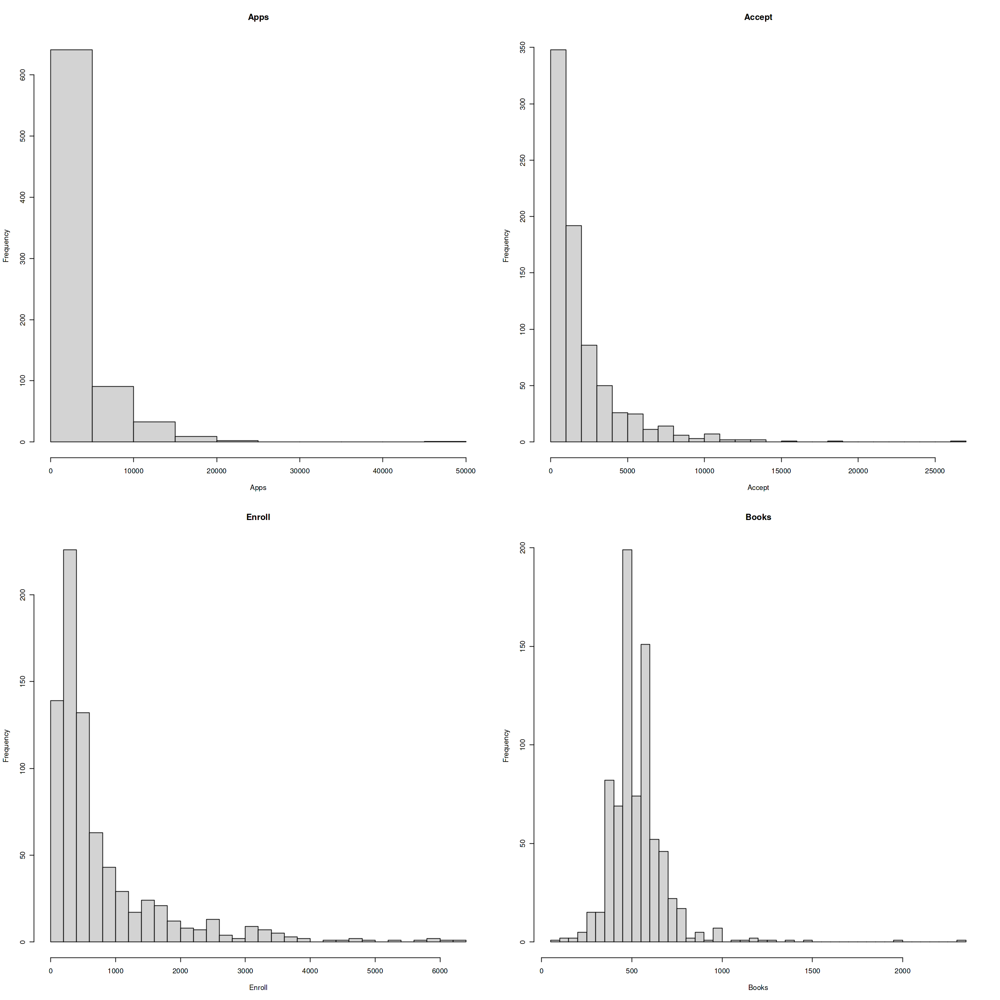

In [12]:
par(mfrow = c(2, 2))
hist(
    college$Apps, 
    main = "Apps", 
    xlab = "Apps", 
    breaks = 10,
)
hist(
    college$Accept, 
    main = "Accept", 
    xlab = "Accept", 
    breaks = 20,
)
hist(
    college$Enroll, 
    main = "Enroll", 
    xlab = "Enroll", 
    breaks = 30,
)
hist(
    college$Books, 
    main = "Books", 
    xlab = "Books", 
    breaks = 40, 
)

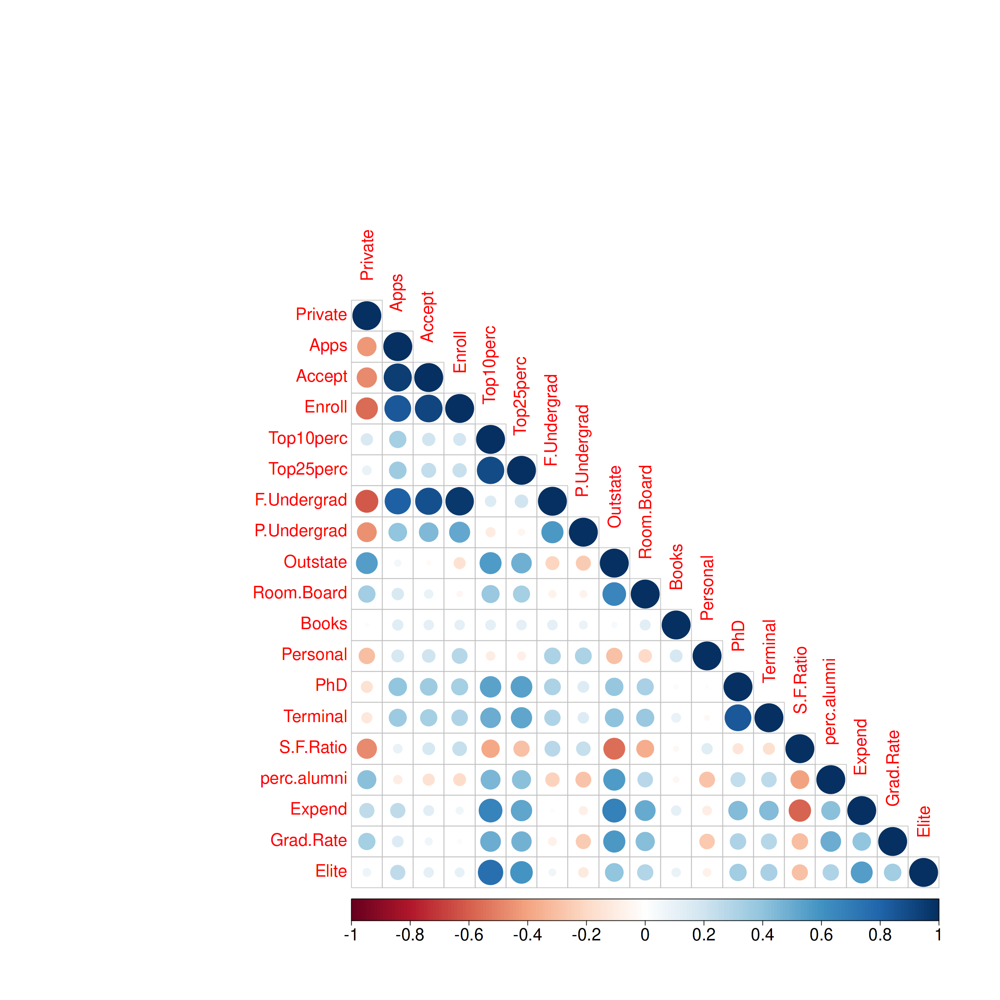

In [13]:
college$Private = ifelse(college$Private == 'Yes', 1, 0)
college$Elite = ifelse(college$Elite == 'Yes', 1, 0)
correlation_matrix = cor(college)
my_corrplot(correlation_matrix)

This would be another good tool for understanding correlations.

## Exercise 9 - The Auto Dataset

In [14]:
auto = read.csv("/kaggle/input/cs5565-datasets/ALL CSV FILES - 2nd Edition/Auto.csv")

In [15]:
auto = na.omit(auto)

In [16]:
summary(auto)

      mpg          cylinders      displacement    horsepower       
 Min.   : 9.00   Min.   :3.000   Min.   : 68.0   Length:397        
 1st Qu.:17.50   1st Qu.:4.000   1st Qu.:104.0   Class :character  
 Median :23.00   Median :4.000   Median :146.0   Mode  :character  
 Mean   :23.52   Mean   :5.458   Mean   :193.5                     
 3rd Qu.:29.00   3rd Qu.:8.000   3rd Qu.:262.0                     
 Max.   :46.60   Max.   :8.000   Max.   :455.0                     
     weight      acceleration        year           origin     
 Min.   :1613   Min.   : 8.00   Min.   :70.00   Min.   :1.000  
 1st Qu.:2223   1st Qu.:13.80   1st Qu.:73.00   1st Qu.:1.000  
 Median :2800   Median :15.50   Median :76.00   Median :1.000  
 Mean   :2970   Mean   :15.56   Mean   :75.99   Mean   :1.574  
 3rd Qu.:3609   3rd Qu.:17.10   3rd Qu.:79.00   3rd Qu.:2.000  
 Max.   :5140   Max.   :24.80   Max.   :82.00   Max.   :3.000  
     name          
 Length:397        
 Class :character  
 Mode  :characte

In [17]:
auto[!grepl("^\\d+$", auto$horsepower),]

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
,<dbl>,<int>,<dbl>,<chr>,<int>,<dbl>,<int>,<int>,<chr>
33,25.0,4,98,?,2046,19.0,71,1,ford pinto
127,21.0,6,200,?,2875,17.0,74,1,ford maverick
331,40.9,4,85,?,1835,17.3,80,2,renault lecar deluxe
337,23.6,4,140,?,2905,14.3,80,1,ford mustang cobra
355,34.5,4,100,?,2320,15.8,81,2,renault 18i


I noticed horsepower was a "\<chr\>", and I thought that was odd.  It appears question marks have been used for NA values. Let's fix that.  

In [18]:
auto[auto== "?"] = NA
auto = na.omit(auto)
auto$horsepower = as.numeric(auto$horsepower)

### (a) Which of the predictors are quantitative, and which are qualitative?
The features origin, name, and year are qualitative.  While year might appear to be quantitative, it isn\'t measuring anything.  Depending on what I\'m trying to predict or infer, I might also treat cylinders as a qualitative since it could be seen as different types of engines. All other predictors are clearly measured values and are quantitative.
### (b) What is the range of each quantitative predictor? You can answer this using the range() function.


In [19]:
quantitative_columns = c("mpg", "cylinders", "displacement", "horsepower", "weight", "acceleration")
find_range = function(auto) {
    range_df = data.frame()
    for (val in quantitative_columns) {
        range_val = range(auto[[val]])
        range_df = rbind(
            range_df, 
            data.frame(
                Column = val,
                Minimum = range_val[1],
                Maximum = range_val[2],
                Range = range_val[2] - range_val[1]
            )
        )
    }
    return(range_df)
}
find_range(auto)

Column,Minimum,Maximum,Range
<chr>,<dbl>,<dbl>,<dbl>
mpg,9,46.6,37.6
cylinders,3,8.0,5.0
displacement,68,455.0,387.0
horsepower,46,230.0,184.0
weight,1613,5140.0,3527.0
acceleration,8,24.8,16.8


### (c) What is the mean and standard deviation of each quantitative predictor?

In [20]:
find_mean_sd = function(auto) {
    mean_sd_df = data.frame()
    for (val in quantitative_columns) {
        mean_val = mean(auto[[val]])
        std_dev_val = sd(auto[[val]])
        mean_sd_df = rbind(
            mean_sd_df,
            data.frame(
                Column = val,
                Mean = mean_val,
                std_dev_val = std_dev_val
            )
        )
    }
    return(mean_sd_df)
}
find_mean_sd(auto)

Column,Mean,std_dev_val
<chr>,<dbl>,<dbl>
mpg,23.445918,7.805007
cylinders,5.471939,1.705783
displacement,194.411990,104.644004
horsepower,104.469388,38.491160
weight,2977.584184,849.402560
acceleration,15.541327,2.758864


### (d) Now remove the 10th through 85th observations. What is the range, mean, and standard deviation of each predictor in the subset of the data that remains?

In [21]:
temp_auto = auto[-c(10:85)]
find_range(temp_auto)
find_mean_sd(temp_auto)

Column,Minimum,Maximum,Range
<chr>,<dbl>,<dbl>,<dbl>
mpg,9,46.6,37.6
cylinders,3,8.0,5.0
displacement,68,455.0,387.0
horsepower,46,230.0,184.0
weight,1613,5140.0,3527.0
acceleration,8,24.8,16.8


Column,Mean,std_dev_val
<chr>,<dbl>,<dbl>
mpg,23.445918,7.805007
cylinders,5.471939,1.705783
displacement,194.411990,104.644004
horsepower,104.469388,38.491160
weight,2977.584184,849.402560
acceleration,15.541327,2.758864


### (e) Using the full data set, investigate the predictors graphically,using scatterplots or other tools of your choice. Create some plots highlighting the relationships among the predictors. Comment on your findings.

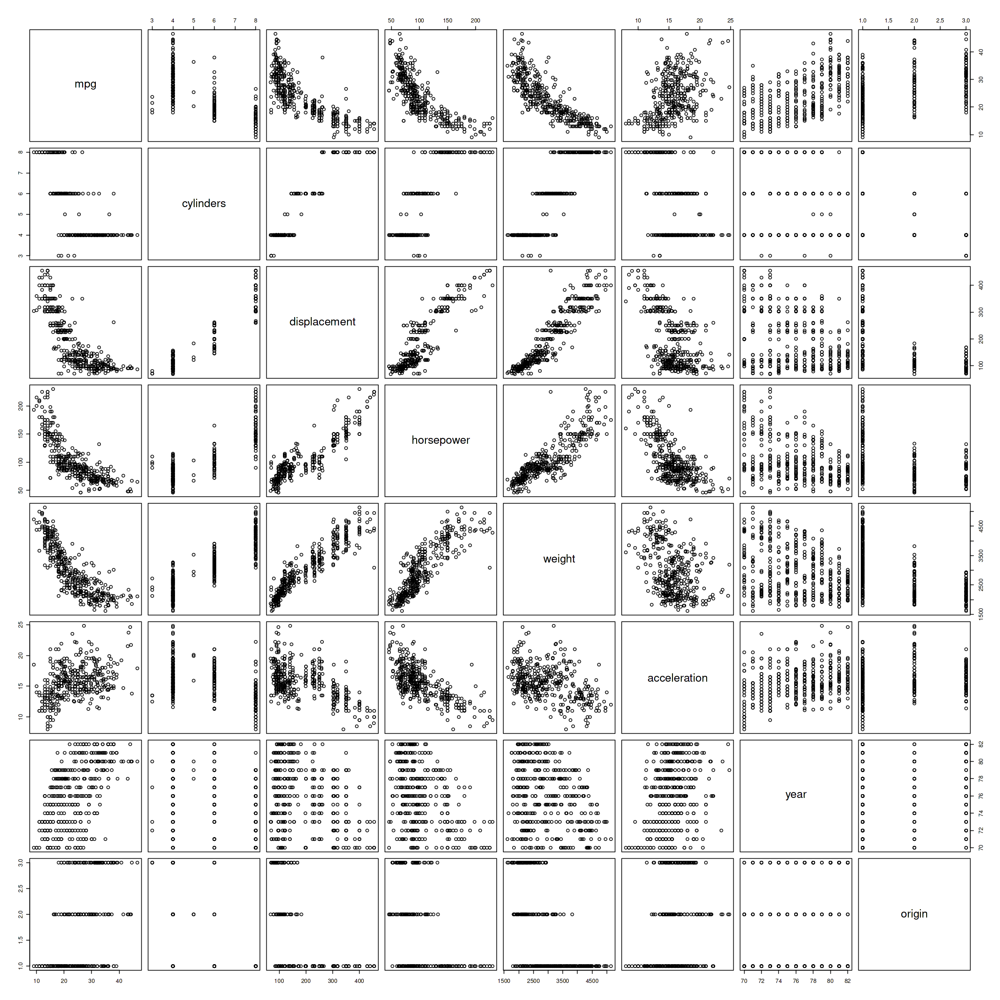

In [22]:
temp_auto = subset(auto, select = -c(name))
pairs(temp_auto, cex.labels = 2)

There appears to be a positive, linear relationship between the variables cylinders, weight, displacement, and horsepower. Conversely, miles per gallon (MPG) and acceleration show a negative correlation with these four features. Newer cars tend to be more fuel-efficient. While country of origin may seem to affect fuel economy, it's important to note that it also has a strong correlation with cylinders, weight, displacement, and horsepower.

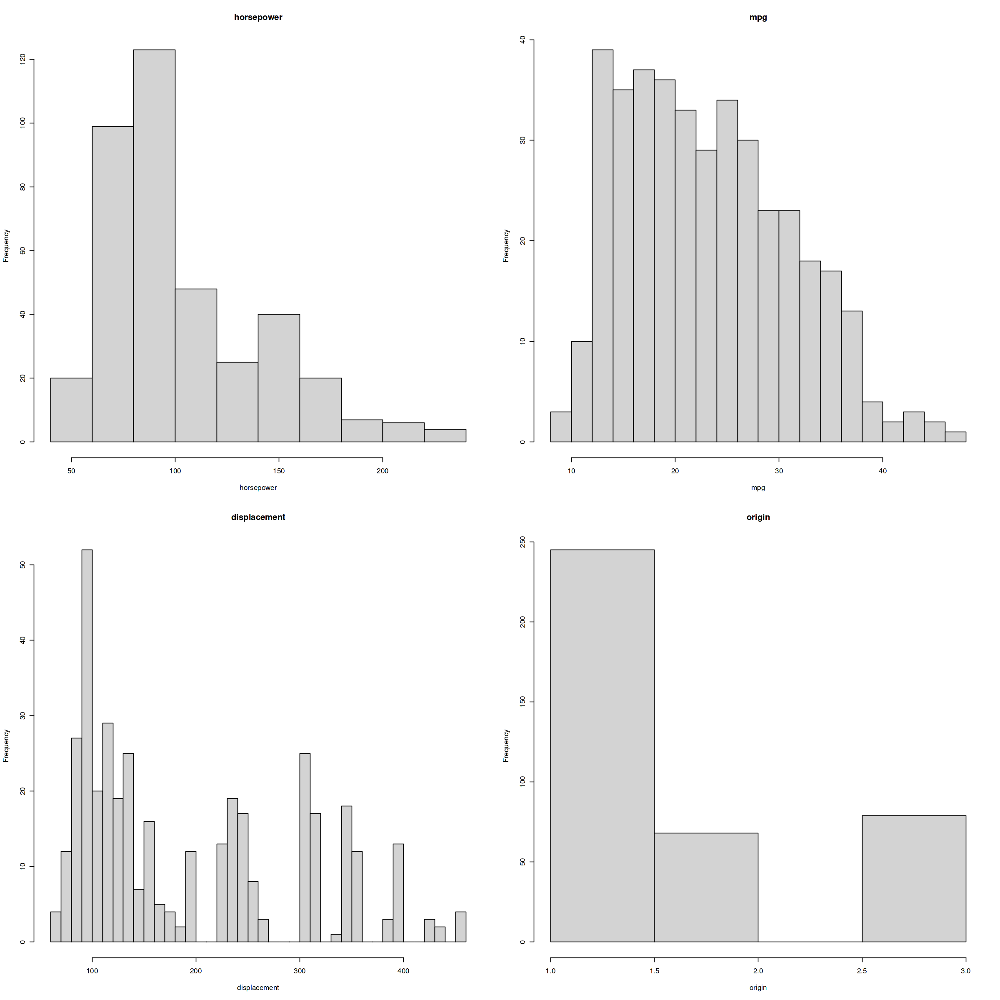

In [23]:
par(mfrow = c(2, 2))
hist(
    auto$horsepower, 
    main = "horsepower", 
    xlab = "horsepower", 
    breaks = 10,   
)
hist(
    auto$mpg, 
    main = "mpg", 
    xlab = "mpg", 
    breaks = 20, 
)
hist(
    auto$displacement, 
    main = "displacement", 
    xlab = "displacement", 
    breaks = 30,
)
hist(
    auto$origin, 
    main = "origin", 
    xlab = "origin", 
    breaks = 3,
)

These histograms illustrate the distribution of the population across these domains. There are comparatively fewer vehicles with high displacement, high horsepower, and high miles per gallon (mpg). Moreover, domestic vehicles constitute the majority of this population.

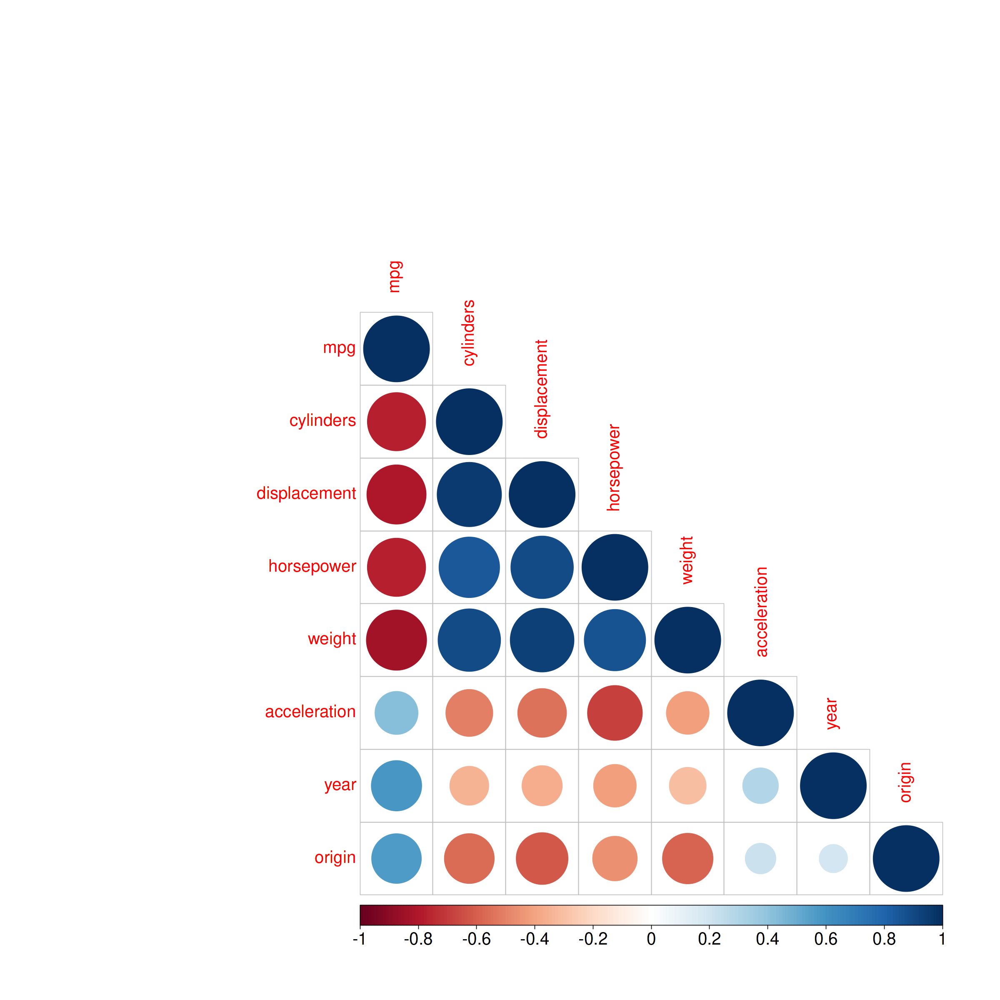

In [24]:
correlation_matrix = cor(temp_auto)
my_corrplot(correlation_matrix)

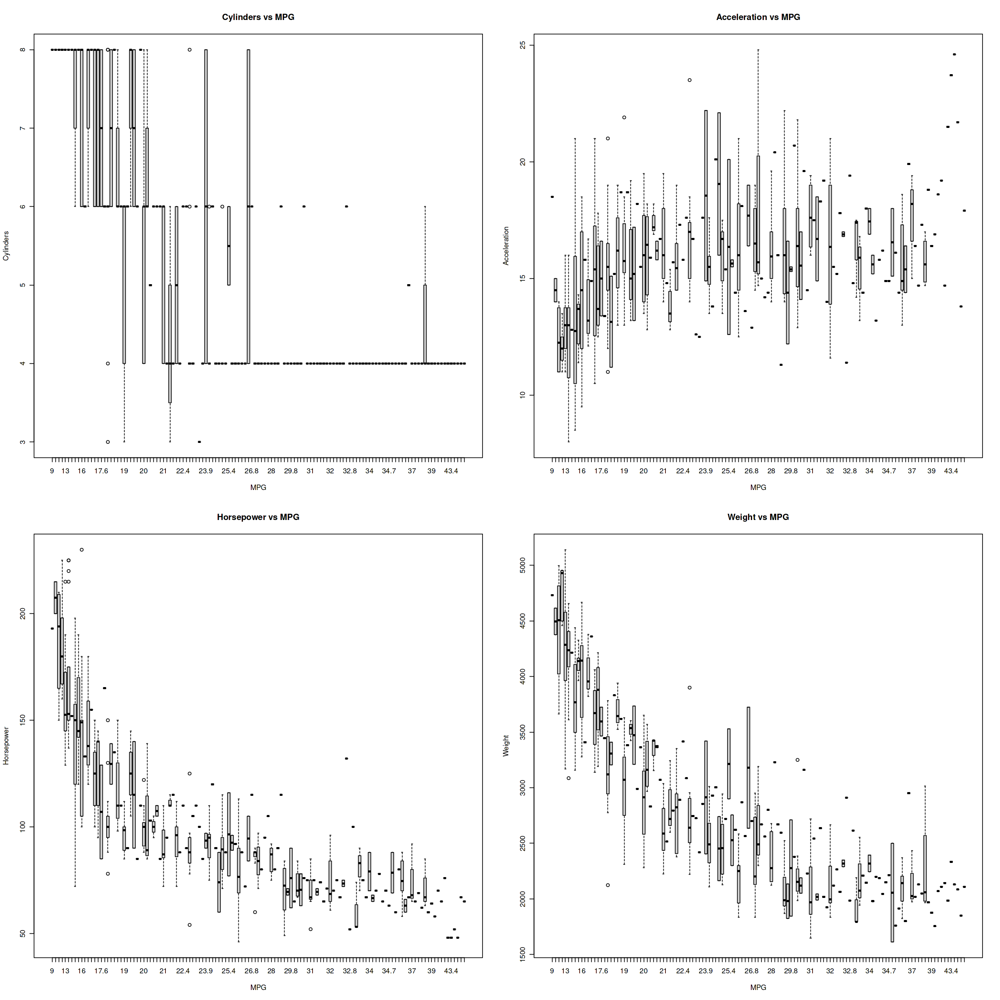

In [25]:
par(mfrow = c(2, 2))
boxplot(auto$cylinders ~ auto$mpg, 
        main = 'Cylinders vs MPG', 
        ylab = "Cylinders", 
        xlab = 'MPG', 
       )
boxplot(auto$acceleration ~ auto$mpg, 
        main = 'Acceleration vs MPG', 
        ylab = "Acceleration", 
        xlab = 'MPG',
       )
boxplot(auto$horsepower ~ auto$mpg, 
        main = 'Horsepower vs MPG', 
        ylab = "Horsepower", 
        xlab = 'MPG',
       )
boxplot(auto$weight ~ auto$mpg, 
        main = 'Weight vs MPG', 
        ylab = "Weight", 
        xlab = 'MPG',
       )

The boxplots above reinforce previous observations. Initially, I was taken aback by the correlation between acceleration and miles per gallon (mpg), but it made sense when I understood that acceleration is also negatively correlated with weight, cylinders, and displacement.

### (f) Suppose that we wish to predict gas mileage (mpg) on the basis of the other variables. Do your plots suggest that any of the other variables might be useful in predicting mpg? Justify your answer
This dataset has many metrics that encapsulate similar data. Although not completely correlated, cylinders and displacement are essentially measuring the same attribute. In addition, origin likely doesn't contribute any useful information to miles per gallon (mpg), as it could potentially be a reflection of different types of vehicles being built in different countries. Similarly, acceleration is largely a product of weight, displacement, and horsepower. However, the 'year' variable deserves further investigation, even though it's negatively correlated with factors that influence low mpg.

## Exercise 10 - The Boston Dataset

### (a) To begin, load in the Boston data set.

In [26]:
Boston

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
3,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2
6,0.02985,0.0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,5.21,28.7
7,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,12.43,22.9
8,0.14455,12.5,7.87,0,0.524,6.172,96.1,5.9505,5,311,15.2,19.15,27.1
9,0.21124,12.5,7.87,0,0.524,5.631,100.0,6.0821,5,311,15.2,29.93,16.5


In [27]:
?Boston

Boston {ISLR2},R Documentation


In [28]:
# assuming your original data is 'Boston' data frame
names(Boston) <- c(
    "crime_rate",
    "percent_25k_ft",
    "percent_non-retail",
    "On_River",
    "percent_NO2",
    "rooms_per_home",
    "built_prior_1940",
    "dist_to_employment",
    "access_to_highways",
    "prop_tax_rate",
    "teacher_ratio",
    "percent_low_status",
    "median_value"
)

### How many rows are in this data set? How many columns? What do the rows and columns represent?
This dataset contains 506 rows with 13 columns.  Each row represents a suburb in the Boston metropolitan area, and each column represents a specific statistic about that suburb.

### (b) Make some pairwise scatterplots of the predictors (columns) in this data set. Describe your findings.

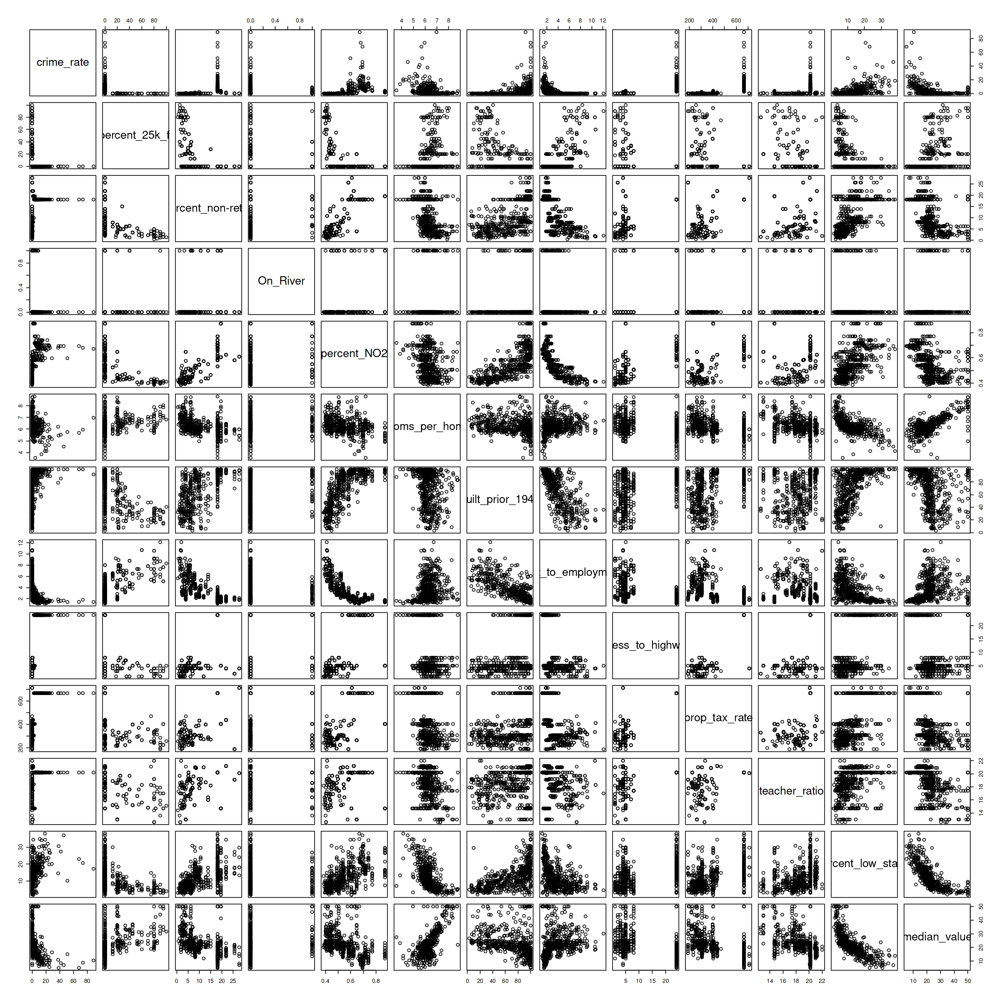

In [29]:
pairs(Boston, cex.labels = 2.0)

Several notable correlations stand out. The weighted mean distance to employment centers is highly correlated with most other variables, including NO2 emissions, the percentage of non-retail zoning, the percentage of low-status population, and the number of homes built prior to 1940. Property tax rates and access to highways also show a significant correlation, but this appears to be influenced by outliers, potentially a suburb with exceptionally high rates and access to radial highways. Finally, the crime rate data reveals a significant proportion of suburbs with low crime rates, contrasted by a relatively few number with high crime rates.

### (c) Are any of the predictors associated with per capita crime rate? If so, explain the relationship.

,crime_rate
,<dbl>
crime_rate,1.00000000
access_to_highways,0.62550515
prop_tax_rate,0.58276431
percent_low_status,0.45562148
percent_NO2,0.42097171
percent_non-retail,0.40658341
built_prior_1940,0.35273425
teacher_ratio,0.28994558
On_River,-0.05589158


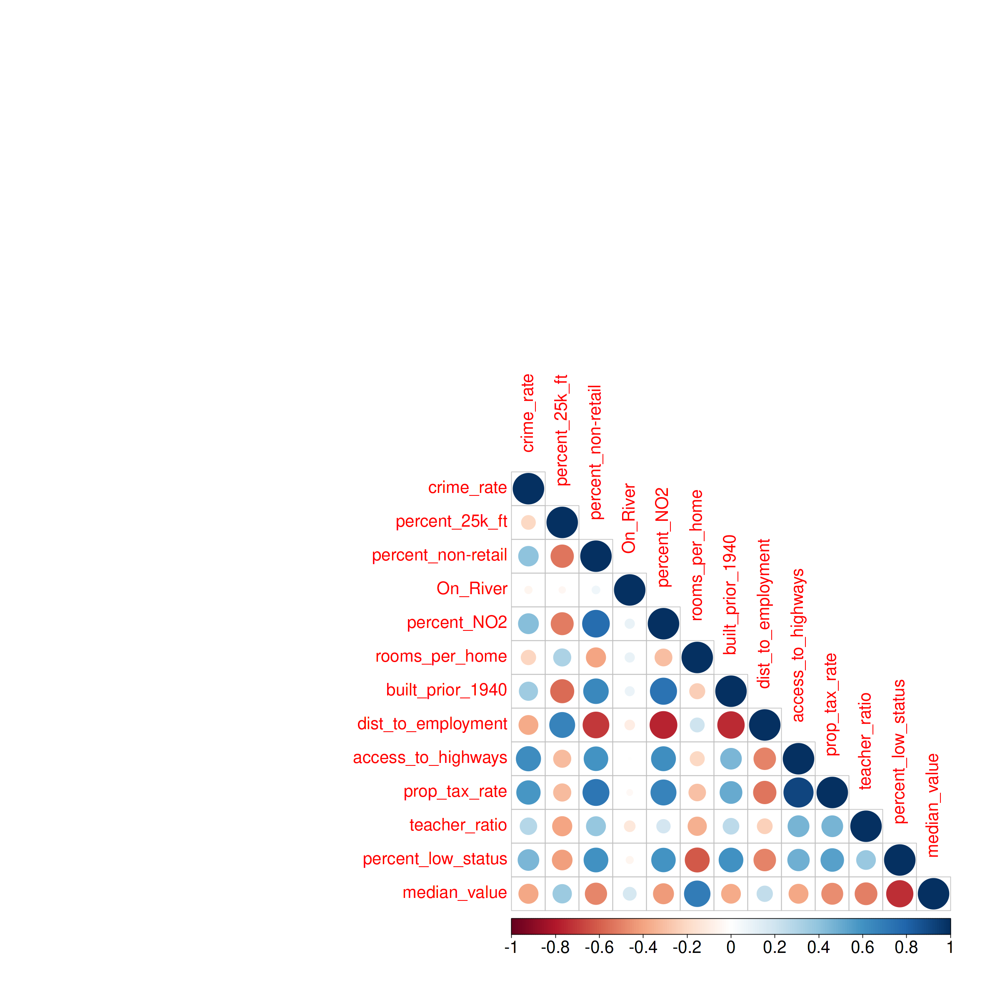

In [30]:
correlation_matrix = cor(Boston)
new_df = as.data.frame(correlation_matrix[,"crime_rate"])
colnames(new_df) = "crime_rate"
sorted_df = new_df[order(new_df["crime_rate"], decreasing = TRUE), , drop = FALSE]
sorted_df
my_corrplot(correlation_matrix)

In [31]:
model <- lm(crime_rate ~ ., data = Boston)
summary(model)


Call:
lm(formula = crime_rate ~ ., data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-8.534 -2.248 -0.348  1.087 73.923 

Coefficients:
                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)          13.7783938  7.0818258   1.946 0.052271 .  
percent_25k_ft        0.0457100  0.0187903   2.433 0.015344 *  
`percent_non-retail` -0.0583501  0.0836351  -0.698 0.485709    
On_River             -0.8253776  1.1833963  -0.697 0.485841    
percent_NO2          -9.9575865  5.2898242  -1.882 0.060370 .  
rooms_per_home        0.6289107  0.6070924   1.036 0.300738    
built_prior_1940     -0.0008483  0.0179482  -0.047 0.962323    
dist_to_employment   -1.0122467  0.2824676  -3.584 0.000373 ***
access_to_highways    0.6124653  0.0875358   6.997 8.59e-12 ***
prop_tax_rate        -0.0037756  0.0051723  -0.730 0.465757    
teacher_ratio        -0.3040728  0.1863598  -1.632 0.103393    
percent_low_status    0.1388006  0.0757213   1.833 0.067398 .  
median_value      

The dataframe and the model above reveal several strong correlations with high certainty. Leading the group are the percentage of nitrous oxides, distance to employment centers, access to radial highways, and number of rooms per dwelling. Nitrous oxides and access to highways exhibit strong positive correlations, while distance to employment centers and the number of rooms per dwelling are strongly negatively correlated.

### d) Do any of the census tracts of Boston appear to have particularly high crime rates? Tax rates? Pupil-teacher ratios? Comment on the range of each predictor.

   crime_rate       prop_tax_rate   teacher_ratio  
 Min.   : 0.00632   Min.   :187.0   Min.   :12.60  
 1st Qu.: 0.08205   1st Qu.:279.0   1st Qu.:17.40  
 Median : 0.25651   Median :330.0   Median :19.05  
 Mean   : 3.61352   Mean   :408.2   Mean   :18.46  
 3rd Qu.: 3.67708   3rd Qu.:666.0   3rd Qu.:20.20  
 Max.   :88.97620   Max.   :711.0   Max.   :22.00  

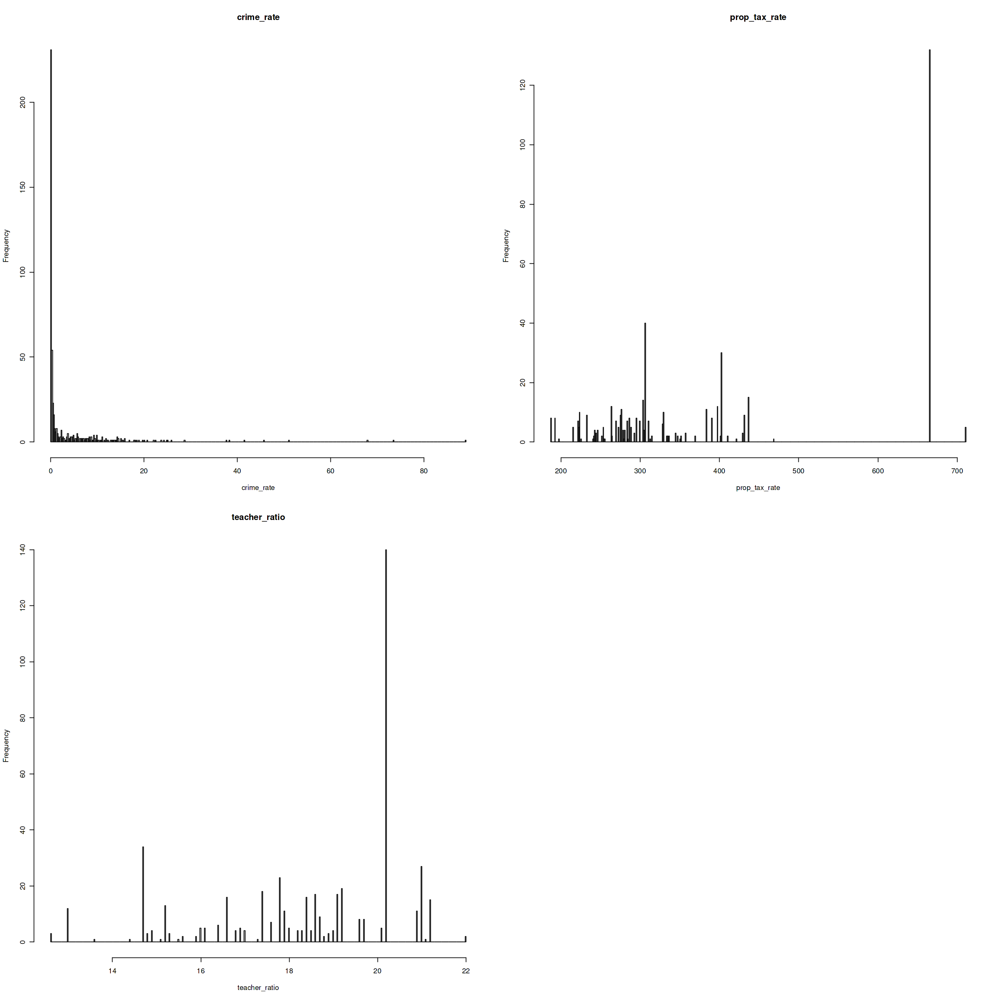

In [32]:
summary(Boston[c('crime_rate', 'prop_tax_rate', 'teacher_ratio')])
par(mfrow = c(2, 2))
hist(
    Boston$'crime_rate', 
    main = "crime_rate", 
    xlab = "crime_rate", 
    breaks = length(Boston$'crime_rate'), 
)
hist(
    Boston$'prop_tax_rate', 
    main = "prop_tax_rate", 
    xlab = "prop_tax_rate", 
    breaks = length(Boston$'prop_tax_rate'), 
)
hist(
    Boston$'teacher_ratio', 
    main = "teacher_ratio", 
    xlab = "teacher_ratio", 
    breaks = length(Boston$'teacher_ratio'), 
)

The range of crime rates is likely the most striking statistic in this dataset. The vast majority of suburbs experience crime rates under ten percent. The third quartile is just under four percent. However, a few outliers greatly skew the data, with the maximum exceeding 80 percent. This is further evidenced by a significant discrepancy between the median of 0.25% and the mean, 3.61%.

Property tax is another feature that appears skewed. This isn't reflected in a difference between the median and mean, but there's a clearly high mode. Speculatively, perhaps a large number of these suburbs are under one high-tax structure, while some suburbs can establish their own, lower-tax structures.

Teacher-pupil ratios are more uniformly distributed. There seems to be a relatively even spread between 18 and 21. However, there are some intriguing aspects. There's a small concentration near 12.5 that would be interesting to compare with the percentage of low-income households, median house values, and crime rate. Additionally, the concentration just above 20 might be influenced by a bureaucratic organization, such as a large school district that spans many suburbs, and thus, reports the same ratio for all the suburbs.

### (e) How many of the census tracts in this data set bound the Charles River?

In [33]:
cat("There are", sum(Boston$On_River == 1), "tracts on the Charles River.\n")

There are 35 tracts on the Charles River.


### (f) What is the median pupil-teacher ratio among the towns in this data set?

In [34]:
cat("The median pupil-teacher ratio among the towns in this dataset is", median(Boston$teacher_ratio))

The median pupil-teacher ratio among the towns in this dataset is 19.05

### (g) Which census tract of Boston has lowest median value of owneroccupied homes? What are the values of the other predictors for that census tract, and how do those values compare to the overall ranges for those predictors? Comment on your findings

In [35]:
cat("The census tract with the lowest median_value is:", which.min(Boston$median_value))

The census tract with the lowest median_value is: 399

The relationship of Tract 399 with the overall ranges is striking. The crime rate is over 12 times the mean, the percentage of nitrous oxides is in the upper 25%, all the homes were built prior to 1940, and the access to highways is the highest. Additionally, both property tax rates and the percentage of low-status residents are exceptionally high.

### (h) In this data set, how many of the census tracts average more than seven rooms per dwelling? More than eight rooms per dwelling? Comment on the census tracts that average more than eight rooms per dwelling.

In [36]:
cat("There are", sum(Boston$rooms_per_home > 7), "tracts with greater than 7 rooms per dwelling\n")
cat("There are", sum(Boston$rooms_per_home > 8), "tracts with greater than 8 rooms per dwelling\n")
big_houses = Boston[Boston$rooms_per_home > 8, ]

There are 64 tracts with greater than 7 rooms per dwelling
There are 13 tracts with greater than 8 rooms per dwelling


In [37]:
summary_big_houses = summary(big_houses)
summary_whole_dataset = summary(Boston)
summary_big_houses
summary_whole_dataset

   crime_rate      percent_25k_ft  percent_non-retail    On_River     
 Min.   :0.02009   Min.   : 0.00   Min.   : 2.680     Min.   :0.0000  
 1st Qu.:0.33147   1st Qu.: 0.00   1st Qu.: 3.970     1st Qu.:0.0000  
 Median :0.52014   Median : 0.00   Median : 6.200     Median :0.0000  
 Mean   :0.71879   Mean   :13.62   Mean   : 7.078     Mean   :0.1538  
 3rd Qu.:0.57834   3rd Qu.:20.00   3rd Qu.: 6.200     3rd Qu.:0.0000  
 Max.   :3.47428   Max.   :95.00   Max.   :19.580     Max.   :1.0000  
  percent_NO2     rooms_per_home  built_prior_1940 dist_to_employment
 Min.   :0.4161   Min.   :8.034   Min.   : 8.40    Min.   :1.801     
 1st Qu.:0.5040   1st Qu.:8.247   1st Qu.:70.40    1st Qu.:2.288     
 Median :0.5070   Median :8.297   Median :78.30    Median :2.894     
 Mean   :0.5392   Mean   :8.349   Mean   :71.54    Mean   :3.430     
 3rd Qu.:0.6050   3rd Qu.:8.398   3rd Qu.:86.50    3rd Qu.:3.652     
 Max.   :0.7180   Max.   :8.780   Max.   :93.90    Max.   :8.907     
 access_to_hi

   crime_rate       percent_25k_ft   percent_non-retail    On_River      
 Min.   : 0.00632   Min.   :  0.00   Min.   : 0.46      Min.   :0.00000  
 1st Qu.: 0.08205   1st Qu.:  0.00   1st Qu.: 5.19      1st Qu.:0.00000  
 Median : 0.25651   Median :  0.00   Median : 9.69      Median :0.00000  
 Mean   : 3.61352   Mean   : 11.36   Mean   :11.14      Mean   :0.06917  
 3rd Qu.: 3.67708   3rd Qu.: 12.50   3rd Qu.:18.10      3rd Qu.:0.00000  
 Max.   :88.97620   Max.   :100.00   Max.   :27.74      Max.   :1.00000  
  percent_NO2     rooms_per_home  built_prior_1940 dist_to_employment
 Min.   :0.3850   Min.   :3.561   Min.   :  2.90   Min.   : 1.130    
 1st Qu.:0.4490   1st Qu.:5.886   1st Qu.: 45.02   1st Qu.: 2.100    
 Median :0.5380   Median :6.208   Median : 77.50   Median : 3.207    
 Mean   :0.5547   Mean   :6.285   Mean   : 68.57   Mean   : 3.795    
 3rd Qu.:0.6240   3rd Qu.:6.623   3rd Qu.: 94.08   3rd Qu.: 5.188    
 Max.   :0.8710   Max.   :8.780   Max.   :100.00   Max.   :12.

,crime_rate,percent_25k_ft,percent_non-retail,On_River,percent_NO2,rooms_per_home,built_prior_1940,dist_to_employment,access_to_highways,prop_tax_rate,teacher_ratio,percent_low_status,median_value
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,102.7757,NaN,-36.01651,NaN,-5.762082,33.63937,1.032258,-9.76009,40,-6.969697,-8.661417,-63.55634,127.8302


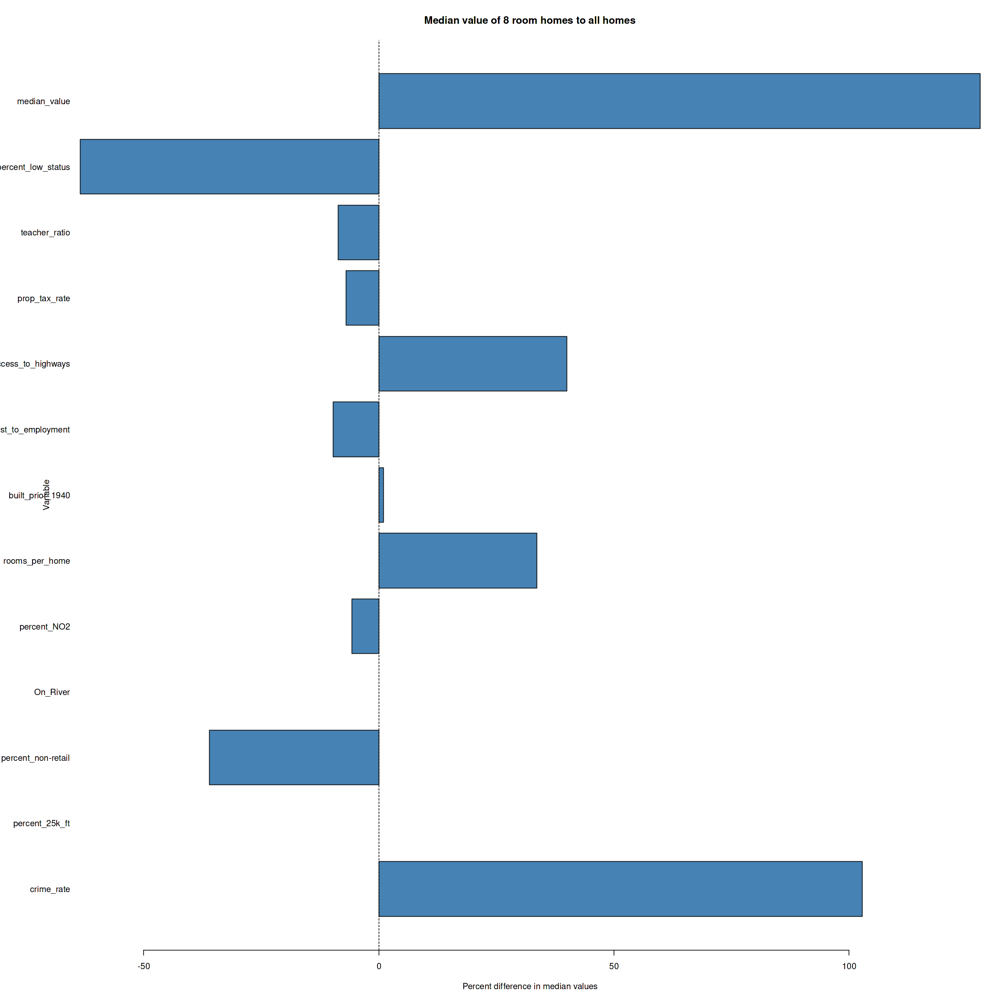

In [38]:
graph_df = data.frame()
for (column_name in names(Boston)) {
  if (is.numeric(Boston[[column_name]])) {
    median_difference =  median(big_houses[[column_name]]) - median(Boston[[column_name]])
    percentage_difference = (median_difference / median(Boston[[column_name]])) * 100
    graph_df[1, column_name] = percentage_difference
  }
}
View(graph_df)
graph_vec <- unlist(graph_df)
names(graph_vec) <- colnames(graph_df)
par(mar = c(5, 8, 4, 2))
barplot(
    height = graph_vec,
    main = "Median value of 8 room homes to all homes", 
    xlab = "Percent difference in median values", 
    ylab = "Variable", 
    horiz = TRUE, 
    las = 1,  
    col = "steelblue"
)
abline(v = 0, lty = 2)  

This has been one of the most surprising observations in the dataset. Homes with more than 8 rooms per dwelling have much higher median values and better access to highways. They have a very low percentage of low-status residents and large non-retail spaces. However, the crime rate is double the median of the overall dataset. This would be an interesting topic to explore. One hypothesis could be the inclusion of minor crimes in the dataset, combined with increased policing in affluent areas.

# 3.7 Exercises - Conceptual
## 1. Describe the null hypotheses to which the p-values given in Table 3.4 correspond. Explain what conclusions you can draw based on these p-values. Your explanation should be phrased in terms of sales, TV, radio, and newspaper, rather than in terms of the coefficients of the linear model.

## Table 3.4


In [39]:
Table_3_4 = data.frame(
    'Coefficient' = c(2.939, 0.046, 0.189, -0.001),
    'Std. error' = c(0.3119, 0.0014, 0.0086, 0.0059),
    't-statistic' = c(9.42, 32.81, 21.89, -0.18),
    'p-value' = c('<0.0001', '<0.0001', '<0.0001', '0.8599')
)
row.names(Table_3_4) = c('Intercept', 'TV', 'radio', 'newspaper')
View(Table_3_4)

,Coefficient,Std..error,t.statistic,p.value
,<dbl>,<dbl>,<dbl>,<chr>
Intercept,2.939,0.3119,9.42,<0.0001
TV,0.046,0.0014,32.81,<0.0001
radio,0.189,0.0086,21.89,<0.0001
newspaper,-0.001,0.0059,-0.18,0.8599


The null hypothesis for the intercept suggests that if all spending on TV, radio and newspaper marketing was zero, then sales would also be zero. The null hypothesis for TV, radio and newspapers suggests that spending in these categories does not have an effect on sales.

Based upon the p-values in the table, it seems that Intercept, TV, and radio have low values and the null hypothesis can be rejected. For TV and radio, this means that spending in these categories has a significant correlation with sales. For the intercept, this means that even if all marketing budgets were set to zero, sales would not be zero.

However, the p-value for the newspaper is significantly above the normal threshold of 0.05. This suggests it would not be appropriate to reject the null hypothesis, and it would be reasonable to assume that money spent on newspaper advertising does not have a significant impact on sales.
## 3. Suppose we have a data set with five predictors, X1 = GPA, X2 = IQ, X3 = Level (1 for College and 0 for High School), X4 = Interaction between GPA and IQ, and X5 = Interaction between GPA and Level. The response is starting salary after graduation (in thousands of dollars). Suppose we use least squares to fit the model, and get βˆ0 = 50, βˆ1 = 20, βˆ2 = 0.07, βˆ3 = 35, βˆ4 = 0.01, βˆ5 = −10.
### (a) Which answer is correct, and why?
#### i. For a fixed value of IQ and GPA, high school graduates earn more, on average, than college graduates.
#### ii. For a fixed value of IQ and GPA, college graduates earn more, on average, than high school graduates.
#### iii. For a fixed value of IQ and GPA, high school graduates earn more, on average, than college graduates provided that the GPA is high enough.
#### iv. For a fixed value of IQ and GPA, college graduates earn more, on average, than high school graduates provided that the GPA is high enough.
The correct answer is iv. The Level generally increases salary. However, the interaction between GPA and Level being negative indicates that GPA has a greater impact on salary for high school graduates than college graduates. This suggests that the advantage conferred by a college degree decreases as GPA increases. Therefore, in some cases, a high-GPA high school graduate would earn more than a low-GPA college graduate.
### (b) Predict the salary of a college graduate with IQ of 110 and a GPA of 4.0.
Salary
= βˆ0 + βˆ1 * GPA + βˆ2 * IQ + βˆ3 * Level + βˆ4 * GPA * IQ + βˆ5 * GPA * Level
= 50 + 20 * 4.0 + 0.07 * 110 + 35 * 1 + 0.01 * 4.0 * 110 - 10 * 4.0 * 1
= $137,100
### (c) True or false: Since the coefficient for the GPA/IQ interaction term is very small, there is very little evidence of an interaction effect. Justify your answer.
False. The size of the coefficient is not an indicator of the interaction effect. We would need data concerning the standard error of the coefficient or p-values to justify a null hypothesis.

# Chapter 3.7 Exercises - Applied
## 8. This question involves the use of simple linear regression on the Auto data set.
### (a) Use the lm() function to perform a simple linear regression with mpg as the response and horsepower as the predictor. Use the summary() function to print the results. Comment on the output.

In [40]:
model = lm(mpg ~ horsepower, data = Auto)
summary_fit = summary(model)
summary_fit


Call:
lm(formula = mpg ~ horsepower, data = Auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.5710  -3.2592  -0.3435   2.7630  16.9240 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 39.935861   0.717499   55.66   <2e-16 ***
horsepower  -0.157845   0.006446  -24.49   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.906 on 390 degrees of freedom
Multiple R-squared:  0.6059,	Adjusted R-squared:  0.6049 
F-statistic: 599.7 on 1 and 390 DF,  p-value: < 2.2e-16


#### i. Is there a relationship between the predictor and the response?
  


In [41]:
summary_fit$coefficients

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),39.9358610,0.717498656,55.65984,1.220362e-187
horsepower,-0.1578447,0.006445501,-24.48914,7.031989e-81


There appears to be a strong relationship between horsepower and mpg with high certainty.  While it hardly can be used solely to predict mpg, it should certainly be kept in a predictive model.

#### ii. How strong is the relationship between the predictor and the response?
  


In [42]:
cat("The relationship between the predictor and the response is very high.  The R-squared is ", summary_fit$r.squared)

The relationship between the predictor and the response is very high.  The R-squared is  0.6059483

#### iii. Is the relationship between the predictor and the response positive or negative?
  


In [43]:
cat("The relationship between the predictor and the response is negative. Coefficient for horsepower: ", coef(model)["horsepower"])

The relationship between the predictor and the response is negative. Coefficient for horsepower:  -0.1578447

#### iv. What is the predicted mpg associated with a horsepower of98? What are the associated 95 % confidence and prediction intervals?
  

In [44]:
hp98 = data.frame(horsepower = 98)
pred = predict(model, newdata = hp98, interval = 'prediction' )
cat("The predicted value for mpg given a 98 horsepower vehicle is ", pred[1,1], "with a 95% prediction interval between ", pred[1,2], " and ", pred[1,3], '\n')
conf = predict(model, newdata = hp98, interval = 'confidence' )
cat("We have a 95% confidence interval between ", conf[1,2], " and ", conf[1,3])


The predicted value for mpg given a 98 horsepower vehicle is  24.46708 with a 95% prediction interval between  14.8094  and  34.12476 
We have a 95% confidence interval between  23.97308  and  24.96108

### (b) Plot the response and the predictor. Use the abline() function to display the least squares regression line.

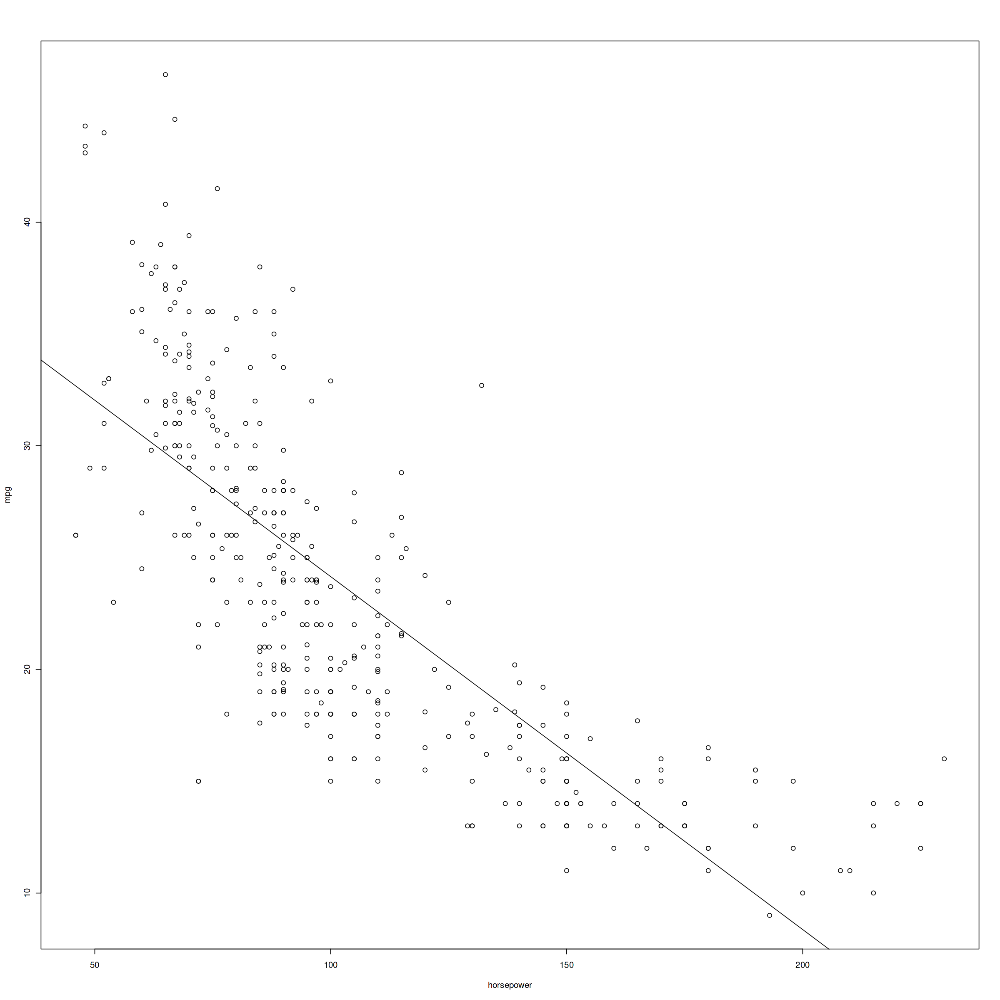

In [45]:
plot(Auto$horsepower, Auto$mpg, xlab = 'horsepower', ylab = 'mpg')
abline(model)

### (c) Use the plot() function to produce diagnostic plots of the least squares regression fit. Comment on any problems you see with the fit.

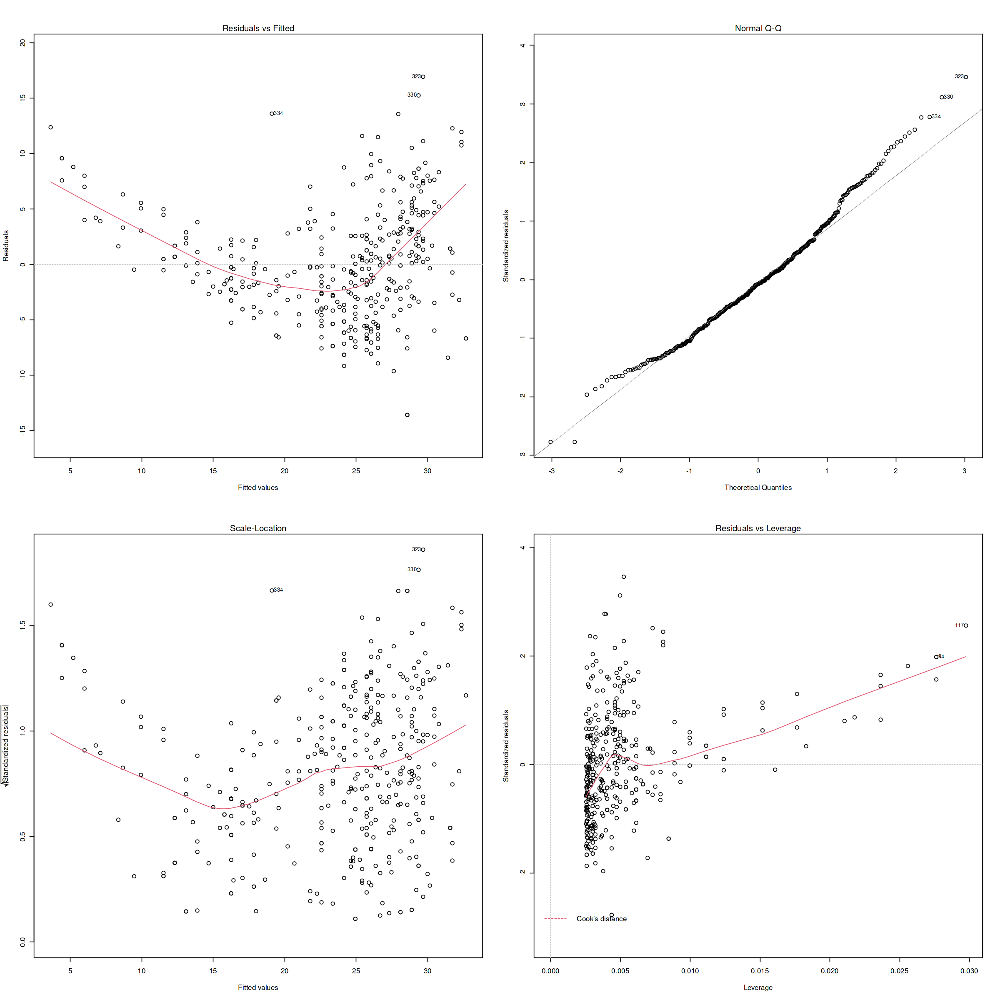

In [46]:
par(mfrow=c(2,2))
plot(model)

The non-linearity displayed in the Residuals vs. Fitted plot is a cause for concern. The changing spread of residuals suggests that a transformation might be needed for the linear model.  
  
Furthermore, the deviation in the Normal Q-Q plot at higher horsepower levels speaks against the suitability of a linear model of horsepower for predicting mpg.  
  
In the Scale-Location plot, an ideal scenario would be a horizontal, flat line. However, we observe a concave curve, indicating a need for a different model.  
  
Lastly, the Residuals vs. Leverage plot shows that there are influential, high-leverage data points that push the Cook's distance above 1, which is another sign of a poor model selection.

## 9. This question involves the use of multiple linear regression on the Auto data set.
### (a) Produce a scatterplot matrix which includes all of the variables in the data set.

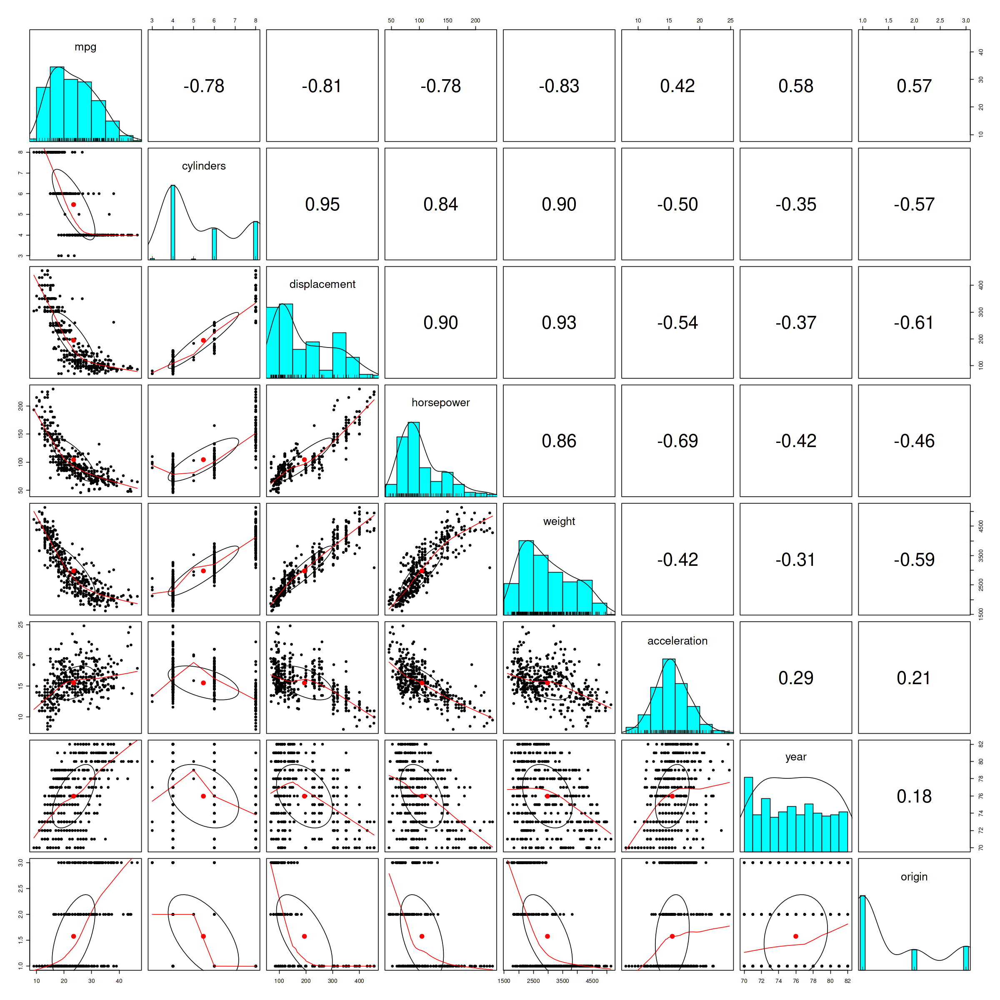

In [47]:
temp_auto = subset(Auto, select = -c(name))
pairs.panels(temp_auto, cex.labels = 2)

Note:  I didn't encode model names

### (b) Compute the matrix of correlations between the variables using the function cor(). You will need to exclude the name variable, cor() which is qualitative

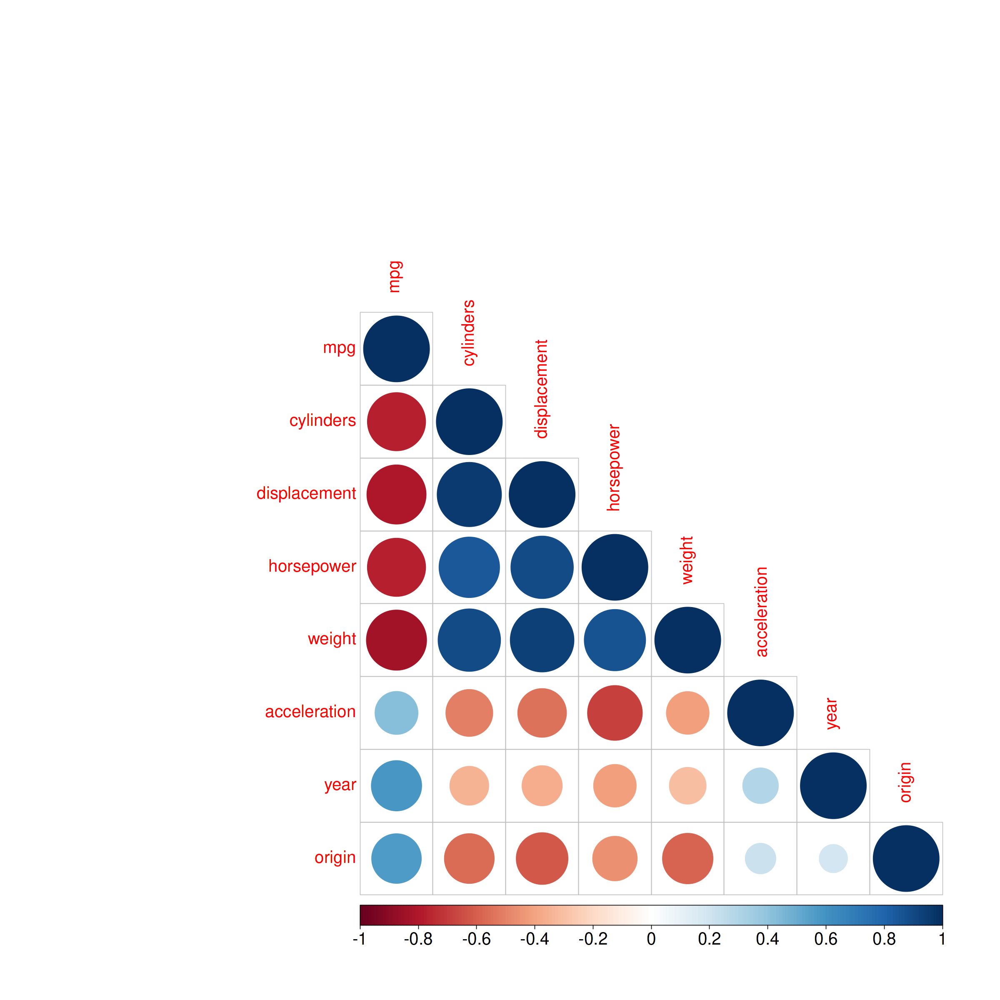

In [48]:
correlation_matrix = cor(temp_auto)
my_corrplot(correlation_matrix)

In [63]:
model = lm(mpg ~ ., data = Auto)
summary(model)


Call:
lm(formula = mpg ~ ., data = Auto)

Residuals:
   Min     1Q Median     3Q    Max 
-5.646  0.000  0.000  0.000  5.646 

Coefficients: (1 not defined because of singularities)
                                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                                0.187305  12.773943   0.015 0.988335
cylinders                                 -0.918096   0.616653  -1.489 0.140231
displacement                               0.003041   0.015621   0.195 0.846109
horsepower                                -0.042342   0.029070  -1.457 0.148919
weight                                    -0.004193   0.001209  -3.467 0.000829
acceleration                              -0.481449   0.171537  -2.807 0.006206
year                                       0.636498   0.112195   5.673 1.89e-07
origin                                     1.324264   4.243221   0.312 0.755737
nameamc ambassador dpl                     3.371358   3.245610   1.039 0.301870
nameamc ambassador

#### i. Is there a relationship between the predictors and the response?

In [64]:
pval = pf(summary(model)$fstatistic[1], summary(model)$fstatistic[2], summary(model)$fstatistic[3], lower.tail = F)
cat("The F-statistic is ", summary(model)$fstatistic, "\n")
cat("The p-value is ", pval)

The F-statistic is  14.80296 306 85 
The p-value is  1.835635e-32

In this case, the extremely low p-value (approximately 1.836 x 10^-32), indicates strong evidence against the null hypothesis. Usually, if the p-value falls below a predetermined significance level (often 0.05), it's considered statistically significant.  
  
Therefore, with such a small p-value, we have strong evidence to reject the null hypothesis, indicating a significant relationship between the predictors and the response variable.

#### ii. Which predictors appear to have a statistically significant relationship to the response?

In [65]:
summary(model)$coefficients

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.187305388,12.773942994,0.014663083,9.883353e-01
cylinders,-0.918096032,0.616652670,-1.488838170,1.402310e-01
displacement,0.003041110,0.015621221,0.194678132,8.461095e-01
horsepower,-0.042342228,0.029069767,-1.456572665,1.489185e-01
weight,-0.004192648,0.001209473,-3.466509749,8.292887e-04
acceleration,-0.481448874,0.171537286,-2.806671865,6.205556e-03
year,0.636497759,0.112194538,5.673161734,1.894602e-07
origin,1.324263763,4.243220865,0.312089284,7.557370e-01
nameamc ambassador dpl,3.371358012,3.245610483,1.038743876,3.018697e-01
nameamc ambassador sst,3.364264053,3.270924003,1.028536294,3.066156e-01


To ascertain which predictor shares the strongest relationship with the response, we would again examine the p-value information. Based on the matrix provided, the variable with the smallest p-value is "namevw dasher (diesel)" with a p-value of approximately 1.229 x 10^-5. This p-value, being the closest to 0, suggests that this variable has the most substantial influence on the model, and therefore, it would be considered the strongest predictor among the other variables.

#### iii. What does the coefficient for the year variable suggest?

In [66]:
coef(model)['year']

year 
0.6364978

Based on the coefficient, we can infer that the 'year' variable has a positive relationship with the response. To contextualize this in practical terms, for each passing year, we expect an increase of approximately 0.64 in the response variable, assuming that other variables remain constant.

### (d) Use the plot() function to produce diagnostic plots of the linear regression fit. Comment on any problems you see with the fit. Do the residual plots suggest any unusually large outliers? Does the leverage plot identify any observations with unusually high leverage?

Warning message:
“not plotting observations with leverage one:
  2, 3, 4, 5, 10, 11, 12, 13, 15, 20, 22, 23, 24, 26, 27, 28, 29, 31, 34, 36, 39, 42, 44, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 66, 67, 68, 69, 70, 71, 73, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 89, 90, 93, 94, 95, 96, 98, 102, 104, 105, 106, 108, 110, 111, 113, 114, 115, 116, 120, 121, 124, 128, 134, 136, 137, 140, 147, 150, 151, 153, 156, 157, 160, 162, 163, 164, 165, 169, 175, 178, 181, 183, 185, 187, 195, 198, 199, 200, 201, 203, 206, 207, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 221, 222, 223, 224, 226, 227, 228, 230, 231, 232, 233, 234, 235, 237, 240, 241, 242, 243, 244, 245, 246, 249, 250, 251, 253, 254, 255, 257, 258, 260, 262, 263, 264, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 285, 286, 287, 290, 291, 292, 293, 294, 295, 296, 297, 300, 301, 303, 304, 306, 309, 311, 313, 316, 317, 319, 321, 324, 325, 326, 327, 328, 330, 331, 332, 333, 337, 3

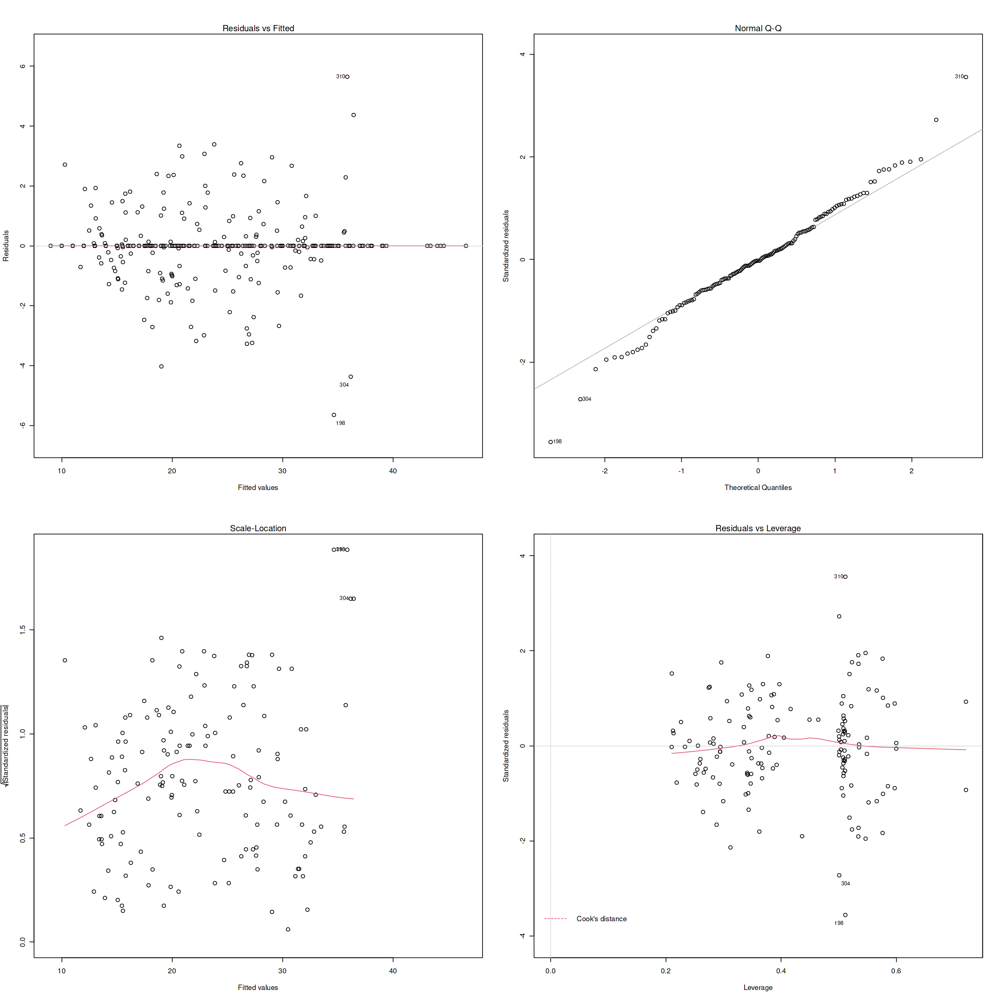

In [67]:
par(mfrow=c(2,2))
plot(model)

For a majority of the plots, the data is quite dispersed, and there appear to be a considerable number of outliers. Outliers can significantly skew the data, leading to potentially inaccurate representations of the model. We might want to consider removing some outliers to improve the fit of our model and achieve a more accurate response. The leverage plots reveal several instances of high leverage, and as previously mentioned, if these outliers are impacting the overall response or outcome, it might be beneficial to either remove them or explore alternative methods to better accommodate these outliers within the model.

### (e) Use the * and : symbols to fit linear regression models with interaction effects. Do any interactions appear to be statistically significant?

In [54]:
pairwise_model = lm(mpg ~ . * ., data = temp_auto)
summary(pairwise_model)


Call:
lm(formula = mpg ~ . * ., data = temp_auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.6303 -1.4481  0.0596  1.2739 11.1386 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)   
(Intercept)                3.548e+01  5.314e+01   0.668  0.50475   
cylinders                  6.989e+00  8.248e+00   0.847  0.39738   
displacement              -4.785e-01  1.894e-01  -2.527  0.01192 * 
horsepower                 5.034e-01  3.470e-01   1.451  0.14769   
weight                     4.133e-03  1.759e-02   0.235  0.81442   
acceleration              -5.859e+00  2.174e+00  -2.696  0.00735 **
year                       6.974e-01  6.097e-01   1.144  0.25340   
origin                    -2.090e+01  7.097e+00  -2.944  0.00345 **
cylinders:displacement    -3.383e-03  6.455e-03  -0.524  0.60051   
cylinders:horsepower       1.161e-02  2.420e-02   0.480  0.63157   
cylinders:weight           3.575e-04  8.955e-04   0.399  0.69000   
cylinders:acceleration  

In [55]:
custom_model_0 = lm(mpg ~ year:acceleration:origin, data = temp_auto)
summary(custom_model_0)
pval = pf(
    summary(custom_model_0)$fstatistic[1], 
    summary(custom_model_0)$fstatistic[2], 
    summary(custom_model_0)$fstatistic[3], 
    lower.tail = F
)


Call:
lm(formula = mpg ~ year:acceleration:origin, data = temp_auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-13.729  -4.045  -1.170   3.395  18.207 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)              1.473e+01  5.882e-01   25.04   <2e-16 ***
year:acceleration:origin 4.567e-03  2.657e-04   17.19   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.895 on 390 degrees of freedom
Multiple R-squared:  0.4311,	Adjusted R-squared:  0.4296 
F-statistic: 295.5 on 1 and 390 DF,  p-value: < 2.2e-16


In [56]:
custom_model_1 = lm(mpg ~ displacement:year:weight, data = temp_auto)
summary(custom_model_1)
pval = pf(
    summary(custom_model_1)$fstatistic[1], 
    summary(custom_model_1)$fstatistic[2], 
    summary(custom_model_1)$fstatistic[3], 
    lower.tail = F
)


Call:
lm(formula = mpg ~ displacement:year:weight, data = temp_auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-11.661  -3.457  -0.751   2.679  17.527 

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)    
(Intercept)               3.140e+01  4.016e-01    78.2   <2e-16 ***
displacement:year:weight -1.606e-07  6.425e-09   -25.0   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.845 on 390 degrees of freedom
Multiple R-squared:  0.6157,	Adjusted R-squared:  0.6147 
F-statistic: 624.7 on 1 and 390 DF,  p-value: < 2.2e-16


In [57]:
# Create dataframe
interaction_p_values <- data.frame(
    Interaction = c(
        "cylinders:acceleration", 
        "cylinders:year", 
        "displacement:weight", 
        "displacement:year", 
        "acceleration:year", 
        "acceleration:origin", 
        "year:origin"
    ),
    P_value = c(
        0.09584, 
        0.07389, 
        0.09342, 
        0.01352, 
        0.03033, 
        0.00365, 
        0.06062
    )
)

interaction_p_values

Interaction,P_value
<chr>,<dbl>
cylinders:acceleration,0.09584
cylinders:year,0.07389
displacement:weight,0.09342
displacement:year,0.01352
acceleration:year,0.03033
acceleration:origin,0.00365
year:origin,0.06062


Several interactions exhibit p-values close to 0 or near the common threshold of 0.05. These significant interactions suggest that the combined effect of the interacting variables on the response variable (assuming other variables are kept constant) is statistically significant and thus, should be incorporated into the model.

### (f) Try a few different transformations of the variables, such aslog(X), √X, X2. Comment on your findings.

Warning message in `[<-.data.frame`(`*tmp*`, , value = list(mpg = c(2.89037175789616, :
“provided 9 variables to replace 8 variables”



Call:
lm(formula = mpg ~ ., data = x_auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.41298 -0.07098  0.00055  0.06150  0.39532 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -0.155391   0.648230  -0.240  0.81068    
cylinders    -0.082815   0.061429  -1.348  0.17841    
displacement  0.006625   0.056970   0.116  0.90748    
horsepower   -0.294389   0.057652  -5.106 5.18e-07 ***
weight       -0.569666   0.082397  -6.914 1.98e-11 ***
acceleration -0.179239   0.059536  -3.011  0.00278 ** 
year          2.243989   0.131661  17.044  < 2e-16 ***
origin        0.044848   0.018821   2.383  0.01767 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.1136 on 384 degrees of freedom
Multiple R-squared:  0.8903,	Adjusted R-squared:  0.8883 
F-statistic: 445.3 on 7 and 384 DF,  p-value: < 2.2e-16


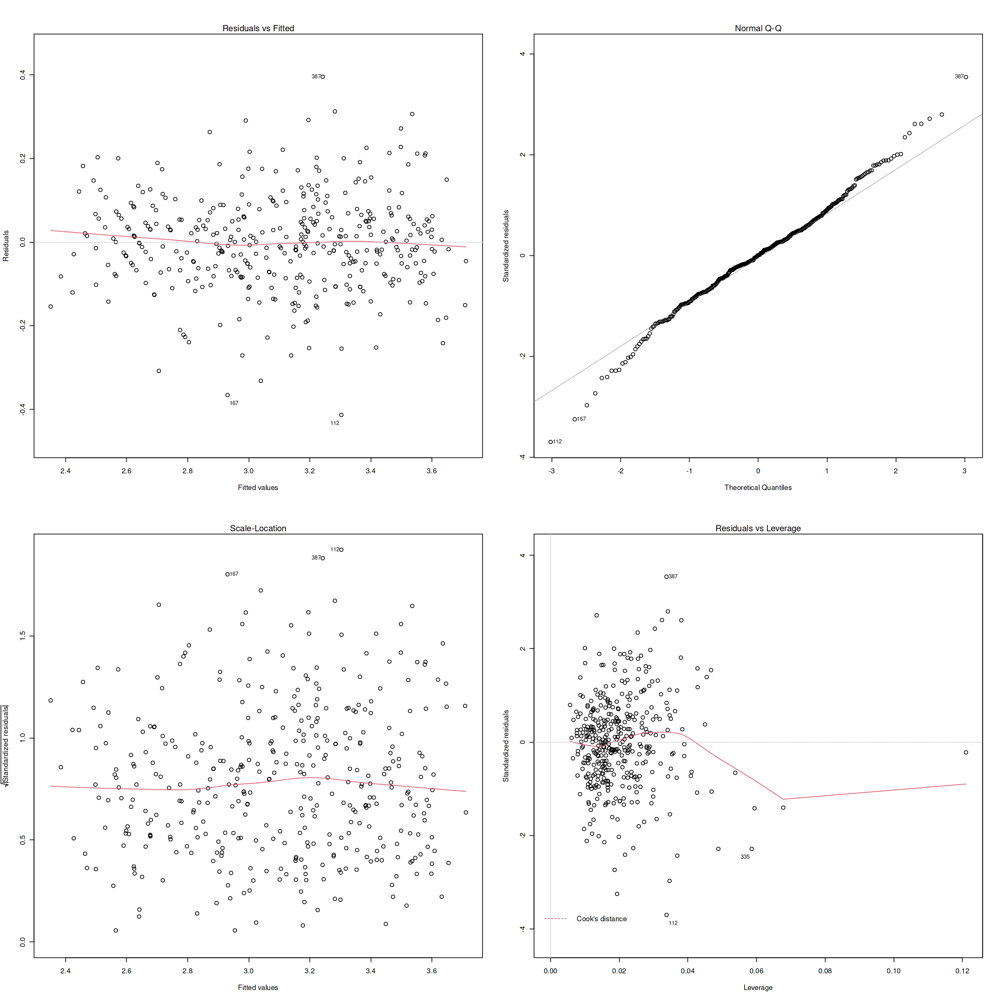

In [58]:
x_auto = temp_auto
x_auto[] = lapply(Auto, function(x) if(is.numeric(x)) log(x) else x)

modelx  = lm(mpg ~ ., data = x_auto)
summary(modelx)
pval = pf(
    summary(modelx)$fstatistic[1], 
    summary(modelx)$fstatistic[2], 
    summary(modelx)$fstatistic[3], 
    lower.tail = F
)
par(mfrow=c(2,2))
plot(modelx)

Warning message in `[<-.data.frame`(`*tmp*`, , value = list(mpg = c(4.24264068711928, :
“provided 9 variables to replace 8 variables”



Call:
lm(formula = mpg ~ ., data = x_auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.98667 -0.17280 -0.00315  0.16145  1.02245 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -1.949286   0.847481  -2.300 0.021979 *  
cylinders    -0.108552   0.141968  -0.765 0.444964    
displacement  0.019707   0.021182   0.930 0.352752    
horsepower   -0.090896   0.028428  -3.197 0.001502 ** 
weight       -0.061414   0.007292  -8.422 7.48e-16 ***
acceleration -0.107258   0.077048  -1.392 0.164699    
year          1.266015   0.079308  15.963  < 2e-16 ***
origin        0.272324   0.070883   3.842 0.000143 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2964 on 384 degrees of freedom
Multiple R-squared:  0.8662,	Adjusted R-squared:  0.8638 
F-statistic: 355.1 on 7 and 384 DF,  p-value: < 2.2e-16


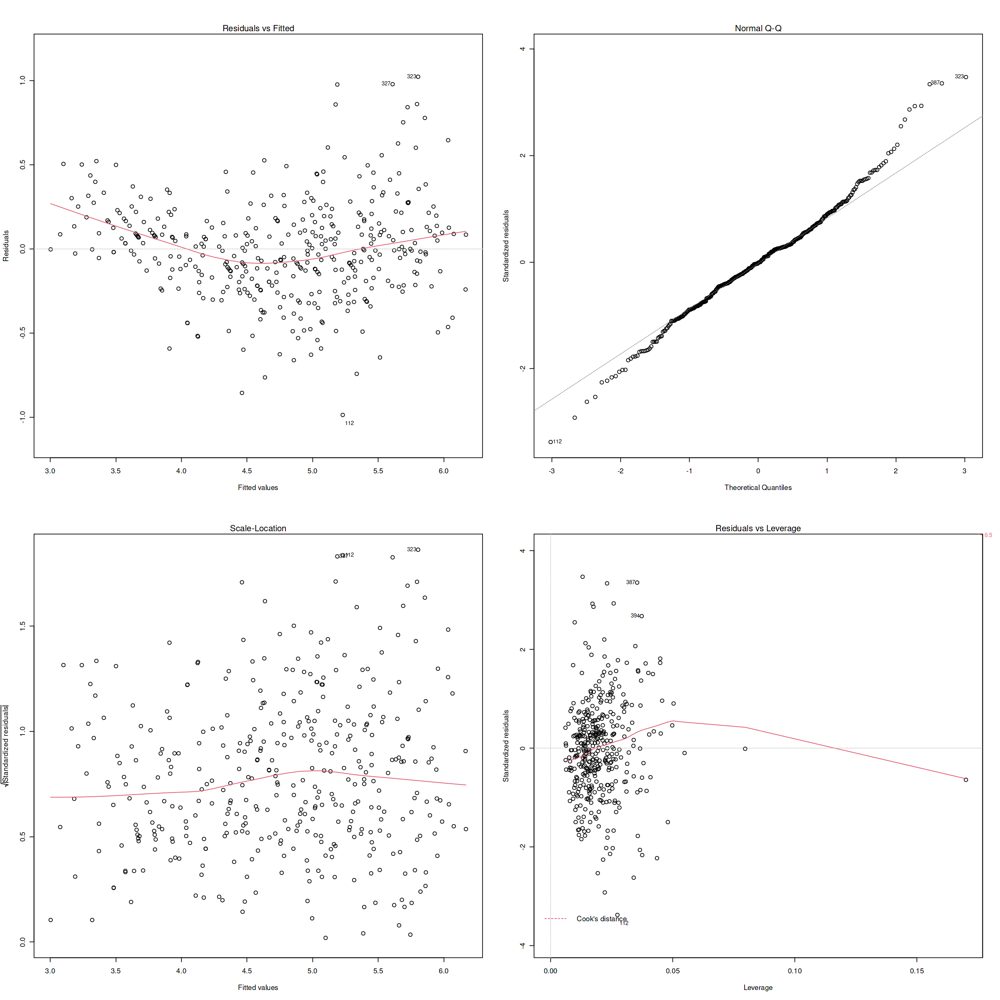

In [59]:
x_auto = temp_auto
x_auto[] = lapply(Auto, function(x) if(is.numeric(x)) sqrt(x) else x)

modelx  = lm(mpg ~ ., data = x_auto)
summary(modelx)
pval = pf(
    summary(modelx)$fstatistic[1], 
    summary(modelx)$fstatistic[2], 
    summary(modelx)$fstatistic[3], 
    lower.tail = F
)
par(mfrow=c(2,2))
plot(modelx)

Warning message in `[<-.data.frame`(`*tmp*`, , value = list(mpg = c(324, 225, 324, :
“provided 9 variables to replace 8 variables”



Call:
lm(formula = mpg ~ ., data = x_auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-501.89 -145.36  -18.91  111.41 1034.08 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -7.523e+02  1.456e+02  -5.165 3.87e-07 ***
cylinders    -3.746e+00  1.559e+00  -2.403 0.016713 *  
displacement  3.356e-03  8.547e-04   3.926 0.000102 ***
horsepower    1.279e-04  3.076e-03   0.042 0.966851    
weight       -4.833e-05  5.551e-06  -8.707  < 2e-16 ***
acceleration  4.892e-01  1.663e-01   2.941 0.003474 ** 
year          2.731e-01  2.183e-02  12.513  < 2e-16 ***
origin        2.608e+01  4.275e+00   6.101 2.57e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 218.8 on 384 degrees of freedom
Multiple R-squared:  0.7055,	Adjusted R-squared:  0.7001 
F-statistic: 131.4 on 7 and 384 DF,  p-value: < 2.2e-16


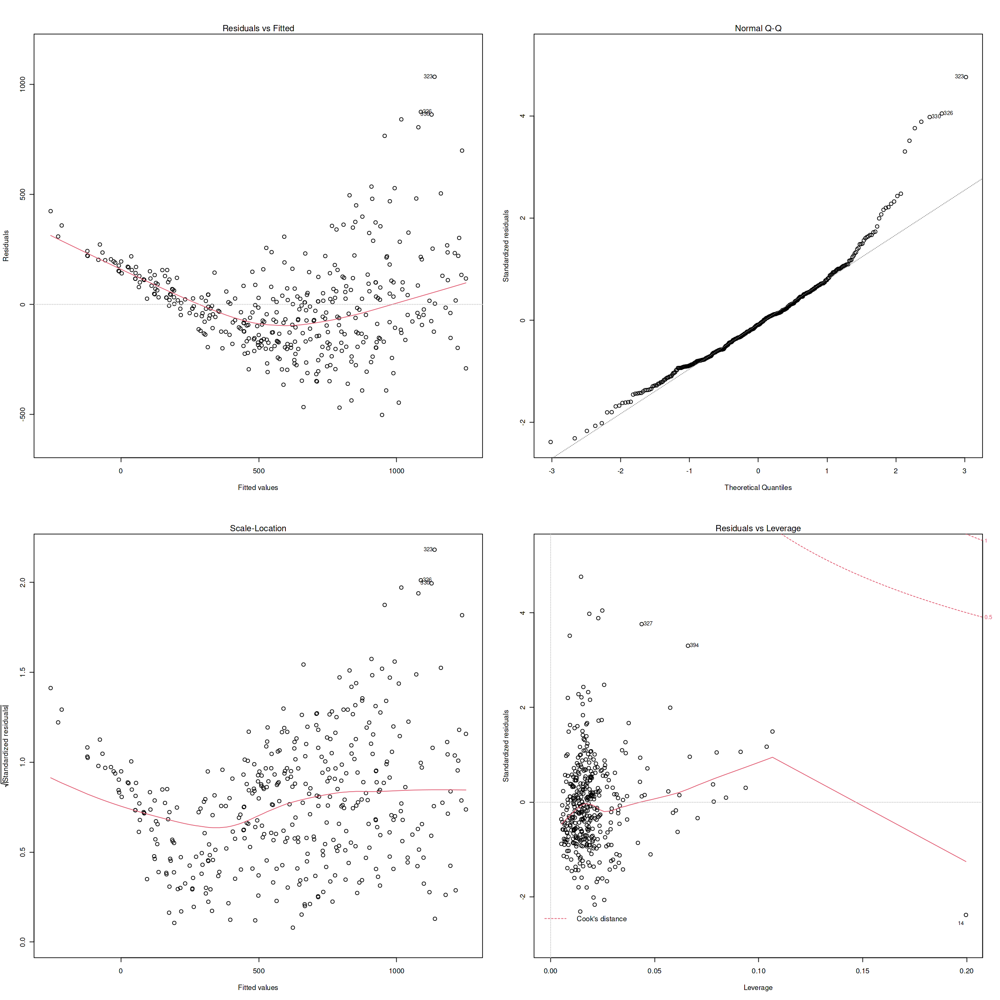

In [60]:
x_auto = temp_auto
x_auto[] = lapply(Auto, function(x) if(is.numeric(x)) x**2 else x)

modelx  = lm(mpg ~ ., data = x_auto)
summary(modelx)
pval = pf(
    summary(modelx)$fstatistic[1], 
    summary(modelx)$fstatistic[2], 
    summary(modelx)$fstatistic[3], 
    lower.tail = F
)
par(mfrow=c(2,2))
plot(modelx)

Warning message in `[<-.data.frame`(`*tmp*`, , value = list(mpg = c(5832, 3375, :
“provided 9 variables to replace 8 variables”



Call:
lm(formula = mpg ~ ., data = x_auto)

Residuals:
   Min     1Q Median     3Q    Max 
-21793  -7195  -1400   5067  62213 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -2.726e+04  4.812e+03  -5.664 2.90e-08 ***
cylinders    -1.685e+01  7.298e+00  -2.308 0.021516 *  
displacement  2.938e-04  8.944e-05   3.285 0.001113 ** 
horsepower    1.820e-04  6.479e-04   0.281 0.778916    
weight       -2.800e-07  4.837e-08  -5.789 1.47e-08 ***
acceleration  1.099e+00  2.982e-01   3.686 0.000261 ***
year          1.030e-01  9.612e-03  10.712  < 2e-16 ***
origin        3.959e+02  6.383e+01   6.202 1.44e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11080 on 384 degrees of freedom
Multiple R-squared:  0.5788,	Adjusted R-squared:  0.5711 
F-statistic: 75.37 on 7 and 384 DF,  p-value: < 2.2e-16


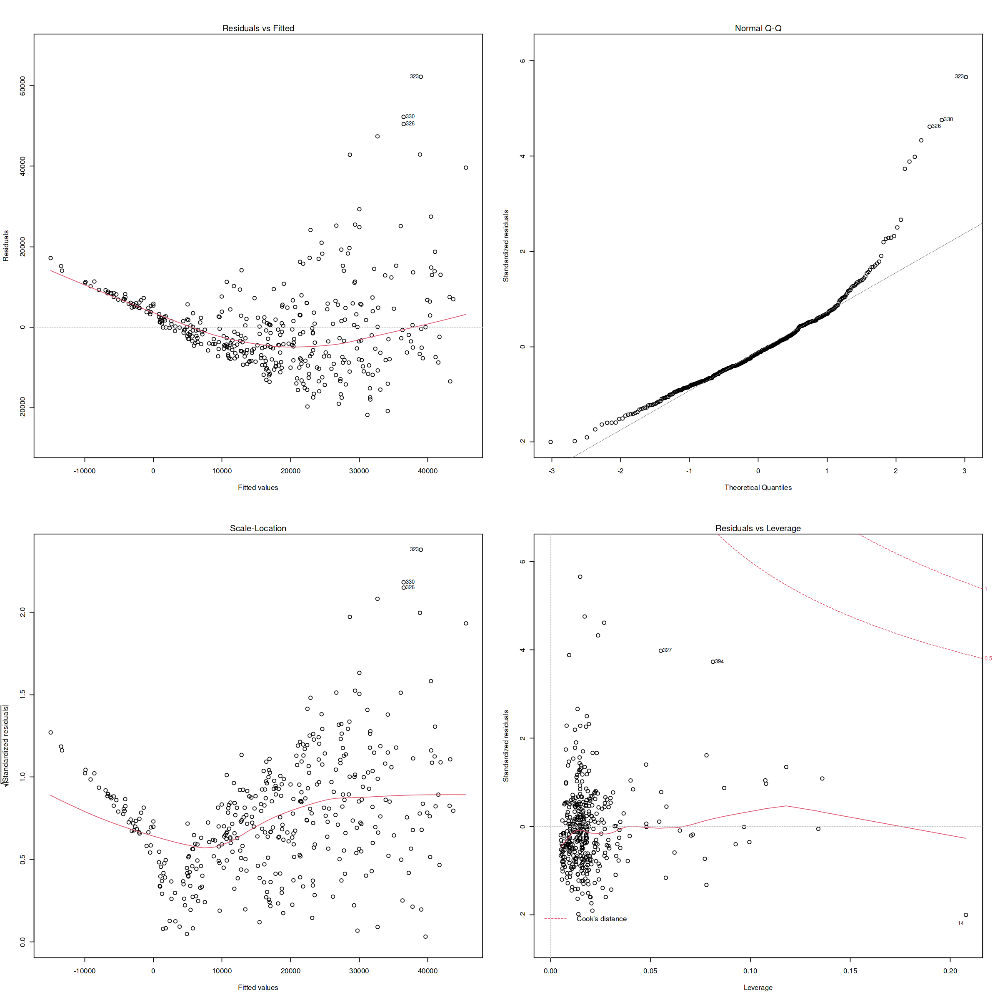

In [61]:
x_auto = temp_auto
x_auto[] = lapply(Auto, function(x) if(is.numeric(x)) x**3 else x)

modelx  = lm(mpg ~ ., data = x_auto)
summary(modelx)
pval = pf(
    summary(modelx)$fstatistic[1], 
    summary(modelx)$fstatistic[2], 
    summary(modelx)$fstatistic[3], 
    lower.tail = F
)
par(mfrow=c(2,2))
plot(modelx)

Depending on the interactions, we can observe that variables have varying effects on the responses, whether positive or negative. Let's consider the first interaction:  
1. The coefficient for Horsepower is negative (-0.294389), indicating that as horsepower increases, mpg decreases.
2. The coefficient for Weight is negative (-0.569666), implying that as weight increases, mpg decreases.
3. The coefficient for Acceleration is negative (-0.179239), suggesting that as acceleration increases, mpg decreases.
4. The coefficient for Year is positive (2.243989), indicating that as the year of the car increases, mpg also increases.
5. The coefficient for Origin is positive (0.044848), suggesting that cars from a specific origin tend to have higher average mpg.  
  
However, when we compare this to the last interaction:  
1. The coefficient for Cylinders is negative (-16.85), implying that as the number of cylinders increases, mpg decreases.
2. The coefficient for Displacement is positive (0.0002938), indicating that as displacement increases, mpg also increases.
3. The coefficient for Weight is negative (-2.8e-07), suggesting that as weight increases, mpg decreases.
4. The coefficient for Acceleration is positive (1.099), indicating that as acceleration increases, mpg also increases.
5. The coefficient for Year is positive (0.103), suggesting that as the year of the car increases, mpg increases.
6. The coefficient for Origin is positive (395.9), indicating that cars from a specific origin tend to have higher average mpg.  
  
This reveals that the choice of variables can lead to different outcomes for the response variable. It highlights the importance of understanding various situations and scenarios in which we would want to investigate the effects of different variables on the response.